# 제주도 버스승차 인원 예측
- ## data 415423 rows × 21 columns
### train columns
- id : 해당 데이터에서의 고유한 id
- data : 날짜
- bus_route_id : 노선 ID
- in_out : 시내버스, 시외버스 구분
- station_code : 해당 승하차 정류소의 id
- station_name : 해당 승하차 정류소의 이름
- latitude : 해당 버스정류장의 위도
- longitude : 해당 버스정류장의 경도
- X-Y_ride : X:00:00 ~ x:59:59까지 승차한 인원 수
- X-Y_takeoff : X:00:00 ~ x:59:59까지 하차한 인원 수
- 18-20_ride : 18:00:00부터 19:59:59까지 승차한 인원 수

In [ ]:
# 추가되는 패키지는 여기에서 import 해주세요
import warnings
warnings.filterwarnings('ignore')
import missingno
import pandas as pd
import numpy as np
import datetime
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import pickle
from sklearn.externals import joblib
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from itertools import count
import plotly_express as px
from tqdm.notebook import tqdm
import geopy.distance

pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', 500)
# matplotlib 설정
mpl.use('Agg')
mpl.rcParams['axes.unicode_minus'] = False
%matplotlib inline
# seaborn 설정
sns.set()
sns.set_style("whitegrid")
sns.set_color_codes()
from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)

In [2]:
from sklearn.base import BaseEstimator, RegressorMixin
import statsmodels.formula.api as smf
import statsmodels.api as sm

class StatsmodelsOLS(BaseEstimator, RegressorMixin):
    def __init__(self, formula):
        self.formula = formula
        self.model = None
        self.data = None
        self.result = None
        
    def fit(self, dfX, dfy):
        self.data = pd.concat([dfX, dfy], axis=1)
        self.model = smf.ols(self.formula, data=self.data)
        self.result = self.model.fit()
        
    def predict(self, new_data):
        return self.result.predict(new_data)

In [3]:
pd.set_option('max_columns', 700)
pd.set_option('max_rows', 500)

# 데이터 전처리 부분 (컬럼 추가, 삭제 등)

In [4]:
# 데이터 load
train = pd.read_csv('train.csv',date_parser='date')
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,6~7_ride,7~8_ride,8~9_ride,9~10_ride,10~11_ride,11~12_ride,6~7_takeoff,7~8_takeoff,8~9_takeoff,9~10_takeoff,10~11_takeoff,11~12_takeoff,18~20_ride
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
415422,415422,2019-09-30,32820000,시내,6115100,서귀포시외버스터미널,33.24873,126.50799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0


In [5]:
# 분석을 위해 컬럼명 수정
train.rename(columns={'6~7_ride': 'ride6', '7~8_ride': 'ride7', '8~9_ride': 'ride8',\
                      '9~10_ride': 'ride9', '10~11_ride': 'ride10', '11~12_ride': 'ride11', 
                      '6~7_takeoff': 'off6', '7~8_takeoff': 'off7', '8~9_takeoff': 'off8', \
                      '9~10_takeoff': 'off9', '10~11_takeoff': 'off10', '11~12_takeoff': 'off11',\
                      '18~20_ride': 'ride18'},inplace=True)
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
415422,415422,2019-09-30,32820000,시내,6115100,서귀포시외버스터미널,33.24873,126.50799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0


In [6]:
# 맞은편 정류장 추가
coords_jejusi = (33.500770, 126.522761) #제주시의 위도 경도
coords_seoquipo = (33.259429, 126.558217) #서귀포시의 위도 경도
train['dis_jejusi'] = [geopy.distance.vincenty((train['latitude'].iloc[i],train['longitude'].iloc[i]), coords_jejusi).km for i in range(len(train))]
train['dis_seoquipo'] = [geopy.distance.vincenty((train['latitude'].iloc[i],train['longitude'].iloc[i]), coords_seoquipo).km for i in range(len(train))]

In [7]:
def get_station_across():
    
    d2 = train
#     d2 = train.loc[0:500] ## 데이터 확인용 
    bar_total = tqdm(d2.index)
    blank = pd.DataFrame()
    
    for i in bar_total:
#         print(str(i)+"/"+ str(len(d2)))
        test = d2.loc[i]
        test_date = d2.loc[i, 'date']
        test_st_name = d2.loc[i, 'station_name']
        test_dis = d2.loc[i, 'dis_jejusi']       
        

        right = d2.query('date == @test_date & station_name == @test_st_name').reset_index()
        right['code'] = abs(right['station_code'] - d2.loc[i, 'station_code'])
        right['standard'] = abs(right['dis_jejusi'] - d2.loc[i, 'dis_jejusi'])
        right['route_id'] = abs(right['bus_route_id'] - d2.loc[i, 'bus_route_id'])

        bag = pd.DataFrame(np.zeros(len(right.columns))).T #26
        bag.columns = right.columns
        bag.station_name = right.station_name
        bag.station_code = right.station_code
        bag.date = right.date
        bag.in_out = right.in_out
        bag.bus_route_id = right.bus_route_id

        
        try:
            A = pd.DataFrame(test).T.merge(pd.DataFrame(right.sort_values(['route_id','code','standard']).reset_index(drop = True).loc[1]).T, on = 'station_name')
        except:
            A = pd.DataFrame(test).T.merge(bag, on = 'station_name')
        
        blank = pd.concat([blank, A])
    blank.drop(['code','standard','index','id_y','holiday_y','date_day_y','date_dayofweek_y','date_dayofname_y','dis_jejusi_y','dis_seoquipo_y','holiday_y','dis_jejusi_y','dis_seoquipo_y','route_id','ride18_y'], axis = 1, inplace = True)
    blank.reset_index(inplace = True)
    return blank

In [ ]:
new_train = get_station_across()
new_train.to_csv('newtrain.csv')
new_train[['date_x','station_code_x','station_name','date_y','station_code_y']]

# 가져오고 train 이름 정리합시다.

In [568]:
# 주소 데이터 가져오기
jeju_addr=pd.read_csv('jeju_addr.csv')
train = pd.merge(train, jeju_addr, on= 'station_code')
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,6~7_ride,7~8_ride,8~9_ride,9~10_ride,10~11_ride,11~12_ride,6~7_takeoff,7~8_takeoff,8~9_takeoff,9~10_takeoff,10~11_takeoff,11~12_takeoff,18~20_ride,지번주소,si,city,dong,road_addr
415421,400433,2019-09-30,22210000,시내,1585,셰프라인월드,33.43489,126.73242,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 구좌읍 송당리 2635-3,제주시,구좌읍,송당리,비자림로
415422,406662,2019-09-30,27180000,시내,3552,행원교차로,33.54574,126.80370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 구좌읍 행원리 1180-3,제주시,구좌읍,행원리,일주동로


In [570]:
# 날씨 추가

# date 타입 변경
train['date'] = train['date'].astype('datetime64')

# 날씨 가져오기
#weather 데이터를 추가하기 전 실행해주세요!
jeju=['제주시','애월읍','조천읍']
seogipo=['서귀포시','남원읍','안덕면']
sungsan=['성산읍','구좌읍','우도면','표선면']
gosan=['한경면','한림읍','대정읍']
chuga=['추자면']
weather_addr=[]
for city in train['city']:
    if city in jeju: weather_addr.append('제주')
    elif city in seogipo: weather_addr.append('서귀포')
    elif city in gosan : weather_addr.append('고산')
    elif city in sungsan : weather_addr.append('성산')
    elif city in chuga : weather_addr.append('추자')    
#weather_addr 컬럼 생성
train['weather_addr']=weather_addr
weather=pd.read_excel('all_weather.xlsx')
train = pd.merge(train, weather, on= ['weather_addr','date'])
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,6~7_ride,7~8_ride,8~9_ride,9~10_ride,10~11_ride,11~12_ride,6~7_takeoff,7~8_takeoff,8~9_takeoff,9~10_takeoff,10~11_takeoff,11~12_takeoff,18~20_ride,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1


In [571]:
# 배차간격 추가
bus_interval = pd.read_csv('bus_interval_final.csv')
train = pd.merge(train, bus_interval, how='left', on='bus_route_id')
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,6~7_ride,7~8_ride,8~9_ride,9~10_ride,10~11_ride,11~12_ride,6~7_takeoff,7~8_takeoff,8~9_takeoff,9~10_takeoff,10~11_takeoff,11~12_takeoff,18~20_ride,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0


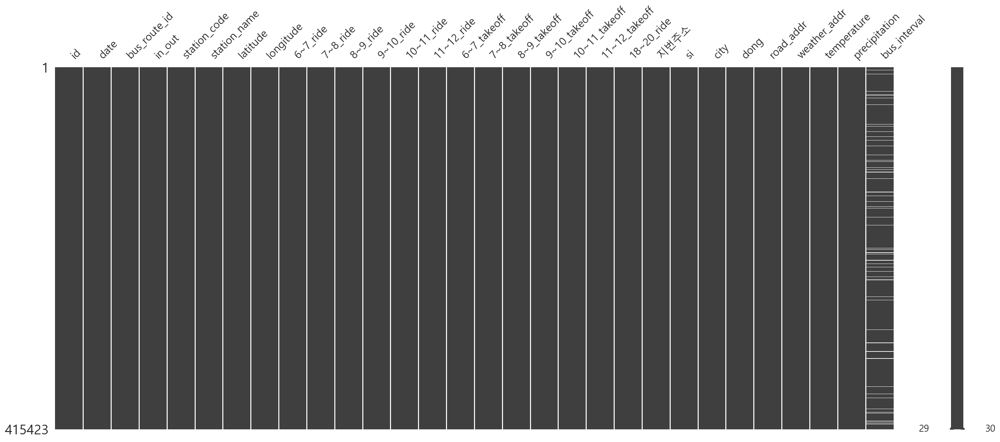

In [237]:
# Nan data 확인
missingno.matrix(train)
plt.show()

In [238]:
# 배차간격에 Nan값 확인
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 415423 entries, 0 to 415422
Data columns (total 30 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   id             415423 non-null  int64         
 1   date           415423 non-null  datetime64[ns]
 2   bus_route_id   415423 non-null  int64         
 3   in_out         415423 non-null  object        
 4   station_code   415423 non-null  int64         
 5   station_name   415423 non-null  object        
 6   latitude       415423 non-null  float64       
 7   longitude      415423 non-null  float64       
 8   6~7_ride       415423 non-null  float64       
 9   7~8_ride       415423 non-null  float64       
 10  8~9_ride       415423 non-null  float64       
 11  9~10_ride      415423 non-null  float64       
 12  10~11_ride     415423 non-null  float64       
 13  11~12_ride     415423 non-null  float64       
 14  6~7_takeoff    415423 non-null  float64       
 15  

In [572]:
# 배차간격이 없는것은 너무오래 안다니는것으로 999로 변경
train['bus_interval'].fillna(999, inplace = True)

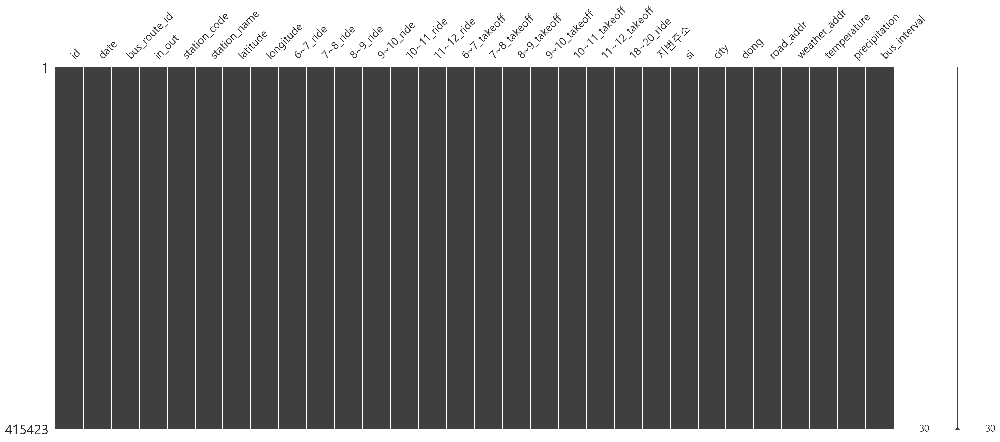

In [573]:
# Nan data 확인
missingno.matrix(train)
plt.show()

In [574]:
# 정확히 Nan값이 없는것을 확인
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 415423 entries, 0 to 415422
Data columns (total 30 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   id             415423 non-null  int64         
 1   date           415423 non-null  datetime64[ns]
 2   bus_route_id   415423 non-null  int64         
 3   in_out         415423 non-null  object        
 4   station_code   415423 non-null  int64         
 5   station_name   415423 non-null  object        
 6   latitude       415423 non-null  float64       
 7   longitude      415423 non-null  float64       
 8   6~7_ride       415423 non-null  float64       
 9   7~8_ride       415423 non-null  float64       
 10  8~9_ride       415423 non-null  float64       
 11  9~10_ride      415423 non-null  float64       
 12  10~11_ride     415423 non-null  float64       
 13  11~12_ride     415423 non-null  float64       
 14  6~7_takeoff    415423 non-null  float64       
 15  

In [575]:
# 분석에 필요없는 컬럼 확인을 위해 컬럼 갯수 확인
for i in train.columns:
    print(f'{i}의 갯수는 ',len(train[i].unique()))

id의 갯수는  415423
date의 갯수는  30
bus_route_id의 갯수는  613
in_out의 갯수는  2
station_code의 갯수는  3563
station_name의 갯수는  1961
latitude의 갯수는  3278
longitude의 갯수는  3446
6~7_ride의 갯수는  47
7~8_ride의 갯수는  80
8~9_ride의 갯수는  78
9~10_ride의 갯수는  66
10~11_ride의 갯수는  66
11~12_ride의 갯수는  69
6~7_takeoff의 갯수는  35
7~8_takeoff의 갯수는  51
8~9_takeoff의 갯수는  53
9~10_takeoff의 갯수는  46
10~11_takeoff의 갯수는  47
11~12_takeoff의 갯수는  55
18~20_ride의 갯수는  170
지번주소의 갯수는  2774
si의 갯수는  2
city의 갯수는  14
dong의 갯수는  178
road_addr의 갯수는  727
weather_addr의 갯수는  5
temperature의 갯수는  62
precipitation의 갯수는  66
bus_interval의 갯수는  140


In [576]:
# # 분석에 필요없는 컬럼 확인을 위해 컬럼 갯수 확인
# for i in test.columns:
#     print(f'{i}의 갯수는 ',len(test[i].unique()))

#### train column 의사결정
- id의 갯수는  415423개로 카테고리 변수이며 해당 변수를 분석에 사용할수 없어서 '삭제'
- date의 갯수는  30개로 카테고리 변수로 해당 변수를 분석에 사용 하기로 함 '킵'
    - 연도와 월은 2019년 9월만 있어서 의미가 없으나, 일과 요일은 사용할수 있을듯, 9월은 12,13,14가 추석임
    - 제주도는 관광도시로 추석에 인원이 더 많을수도 있음
- bus_route_id의 갯수는  613개로 카테고리 변수이며 해당 변수를 분석에 사용 할수는 없으나, 다른 분석에 쓰일수 있어서 '킵'
    - station_code별 bus_route_id의 갯수를 구하면 해당 정류장에 오는 버스노선의 수를 알수 있음.
- in_out의 갯수는  2개로 카테고리 변수이며, 해당 변수를 분석에 사용하기로 함 '킵'
    - 시내, 시외 비율 확인
- station_code의 갯수는  3563개로 카테고리 변수이며 분석에는 사용하지 않음
    - 정류소 구분을 위해 일단 킵
- station_name의 갯수는  1961개로 카테고리 변수이며 분석에는 사용하지 않음
    - 정류소 구분을 위해 일단 킵
- latitude의 갯수는  3278개로 위치정보이므로 일단 사용
    - 특정 지점을 기준하여 거리화 해보기
- longitude의 갯수는  3446개로 위치정보이므로 일단 사용
    - 특정 지점을 기준하여 거리화 해보기
- 6~7_ride의 갯수는  47 : 킵
    - 이하 말이 필요없음 무조건 킵
- 7~8_ride의 갯수는  80 : 킵
- 8~9_ride의 갯수는  78 : 킵
- 9~10_ride의 갯수는  66 : 킵
- 10~11_ride의 갯수는  66 : 킵
- 11~12_ride의 갯수는  69 : 킵
- 6~7_takeoff의 갯수는  35 : 킵
- 7~8_takeoff의 갯수는  51 : 킵
- 8~9_takeoff의 갯수는  53 : 킵
- 9~10_takeoff의 갯수는  46 : 킵
- 10~11_takeoff의 갯수는  47 : 킵
- 11~12_takeoff의 갯수는  55 : 킵
- 18~20_ride의 갯수는  170 : 킵
- 지번주소의 갯수는  2774 : 날씨 데이터 merge용
- si의 갯수는  2 : 날씨 데이터 merge용
- city의 갯수는  14 : 날씨 데이터 merge용
- dong의 갯수는  178 : 날씨 데이터 merge용
- road_addr의 갯수는  727 : 날씨 데이터 merge용
- weather_addr의 갯수는  5 : 날씨 데이터 merge용
- temperature의 갯수는  62 : 킵
- precipitation의 갯수는  66 : 킵
- bus_interval의 갯수는  140 : 킵

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0


In [578]:
# 시작 날짜와, 끝 날짜 확인
print(train['date'].min())
print(train['date'].max())
# date 타입 변경
# train['date'] = train['date'].astype('datetime64')
# 9월 1일 ~ 9월 30일 데이터이니까, day만 따로 가져옴
train['date_day'] = train['date'].dt.day
# 월(0) ~ 일(6) 데이터로 변환
train['date_dayofweek'] = train['date'].dt.dayofweek
train['date_dayofname']= train['date'].dt.day_name()
train[['date','date_dayofweek','date_day','date_dayofname']]

# 평일과 휴일의 원핫 인코딩
train.loc[train['date_dayofweek'] == 0, 'weekday' ] = 1
train.loc[train['date_dayofweek'] == 1, 'weekday' ] = 1
train.loc[train['date_dayofweek'] == 2, 'weekday' ] = 1
train.loc[train['date_dayofweek'] == 3, 'weekday' ] = 1
train.loc[train['date_dayofweek'] == 4, 'weekday' ] = 0
train.loc[train['date_dayofweek'] == 5, 'weekday' ] = 0
train.loc[train['date_dayofweek'] == 6, 'weekday' ] = 0

#Weekend 주말
train.loc[train['date_dayofweek'] == 0, 'weekend' ] = 0
train.loc[train['date_dayofweek'] == 1, 'weekend' ] = 0
train.loc[train['date_dayofweek'] == 2, 'weekend' ] = 0
train.loc[train['date_dayofweek'] == 3, 'weekend' ] = 0
train.loc[train['date_dayofweek'] == 4, 'weekend' ] = 1
train.loc[train['date_dayofweek'] == 5, 'weekend' ] = 1
train.loc[train['date_dayofweek'] == 6, 'weekend' ] = 1

# 추석 추가도 공휴일로 처리
train['holiday'] = 0
train.loc[train['date'] == '2019-09-14', 'holiday'] = 1
train.loc[train['date'] == '2019-09-13', 'holiday'] = 1
train.loc[train['date'] == '2019-09-12', 'holiday'] = 1

# 태풍의 컬럼 추가
train['typhoon'] = 0
train.loc[train['date'] == '2019-09-06', 'typhoon'] = 1
train.loc[train['date'] == '2019-09-07', 'typhoon'] = 1
train.loc[train['date'] == '2019-09-21', 'typhoon'] = 1
train.loc[train['date'] == '2019-09-22', 'typhoon'] = 1

train.tail(2)

2019-09-01 00:00:00
2019-09-30 00:00:00


,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0,22,6,Sunday,0.0,1.0,0,1
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0,22,6,Sunday,0.0,1.0,0,1


In [579]:
# 시내, 시외 원핫 인코딩
in_out = pd.get_dummies(train['in_out'])
in_out.columns = ['in_', 'out']
train = pd.concat([train, in_out], axis = 1)
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0,22,6,Sunday,0.0,1.0,0,1,1,0
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0,22,6,Sunday,0.0,1.0,0,1,1,0


In [580]:
# 2시간 노선 만들기
train['ride67'] = train['ride6'] + train['ride7']
train['ride89'] = train['ride8'] + train['ride9']
train['ride1011'] = train['ride10'] + train['ride11']
train['off67'] = train['off6'] + train['off7']
train['off89'] = train['off8'] + train['off9']
train['off1011'] = train['off10'] + train['off11']
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0,22,6,Sunday,0.0,1.0,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0,22,6,Sunday,0.0,1.0,0,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0


In [581]:
# 탑승의 총합 만들기
train['ride_sum'] = train['ride6'] + train['ride7'] + train['ride8'] + train['ride9'] + train['ride10'] + train['ride11']

In [582]:
# 하차의 총합만들기
train['off_sum'] = train['off6'] + train['off7'] + train['off8'] + train['off9'] + train['off10'] + train['off11']

In [585]:
# 일별, 정류장별 버스노선 갯수
station_table = pd.pivot_table(index=['station_code', 'date'],values='bus_route_id', data=train, aggfunc=len).reset_index()
station_table.columns = ['station_code', 'date', 'bus_route_id_sum']
train = pd.merge(train, station_table, how='left', on=['station_code', 'date'])

# 정류장별 버스노선의 갯수
station_table = pd.pivot_table(index=['station_code'],values='bus_route_id', data=train, aggfunc=len).reset_index()
station_table.columns = ['station_code', 'bus_route_id_all_sum']
train = pd.merge(train, station_table, how='left', on=['station_code'])

train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum
415421,294340,2019-09-22,31590000,시내,2740,하모체육공원,33.21875,126.25229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,제주특별자치도 서귀포시 대정읍 하모리 2148,서귀포시,대정읍,하모리,최남단해안로,고산,20.5,34.1,67.0,22,6,Sunday,0.0,1.0,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2,13
415422,292357,2019-09-22,27700000,시내,4122,붉으내,33.31893,126.17250,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한경면 용수리 4719-1,제주시,한경면,용수리,한경해안로,고산,20.5,34.1,94.0,22,6,Sunday,0.0,1.0,0,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,1


In [586]:
# # 버스 노선 원핫 인코딩
# train['bus_route_id'] = train['bus_route_id'].astype(str)
# bus = pd.get_dummies(train['bus_route_id'])
# bus_columns = bus.columns
# train = pd.concat([train, bus], axis = 1)
# train.head()

In [587]:
train.columns

Index(['id', 'date', 'bus_route_id', 'in_out', 'station_code', 'station_name',
       'latitude', 'longitude', 'ride6', 'ride7', 'ride8', 'ride9', 'ride10',
       'ride11', 'off6', 'off7', 'off8', 'off9', 'off10', 'off11', 'ride18',
       '지번주소', 'si', 'city', 'dong', 'road_addr', 'weather_addr',
       'temperature', 'precipitation', 'bus_interval', 'date_day',
       'date_dayofweek', 'date_dayofname', 'weekday', 'weekend', 'holiday',
       'typhoon', 'in_', 'out', 'ride67', 'ride89', 'ride1011', 'off67',
       'off89', 'off1011', 'ride_sum', 'off_sum', 'bus_route_id_sum',
       'bus_route_id_all_sum'],
      dtype='object')

# Data EDA

In [22]:
# 컬럼별 값들의 갯수는?
for i in train.columns:
    print(f'{i}의 갯수는 ',len(train[i].unique()))

id의 갯수는  415423
date의 갯수는  30
bus_route_id의 갯수는  613
in_out의 갯수는  2
station_code의 갯수는  3563
station_name의 갯수는  1961
latitude의 갯수는  3278
longitude의 갯수는  3446
ride6의 갯수는  47
ride7의 갯수는  80
ride8의 갯수는  78
ride9의 갯수는  66
ride10의 갯수는  66
ride11의 갯수는  69
off6의 갯수는  35
off7의 갯수는  51
off8의 갯수는  53
off9의 갯수는  46
off10의 갯수는  47
off11의 갯수는  55
ride18의 갯수는  170
지번주소의 갯수는  2774
si의 갯수는  2
city의 갯수는  14
dong의 갯수는  178
road_addr의 갯수는  727
weather_addr의 갯수는  5
temperature의 갯수는  62
precipitation의 갯수는  66
bus_interval의 갯수는  140
date_day의 갯수는  30
date_dayofweek의 갯수는  7
date_dayofname의 갯수는  7
weekday의 갯수는  2
weekend의 갯수는  2
holiday의 갯수는  2
in_의 갯수는  2
out의 갯수는  2
ride67의 갯수는  98
ride89의 갯수는  107
ride1011의 갯수는  97
off67의 갯수는  66
off89의 갯수는  75
off1011의 갯수는  84
ride_sum의 갯수는  216
off_sum의 갯수는  160


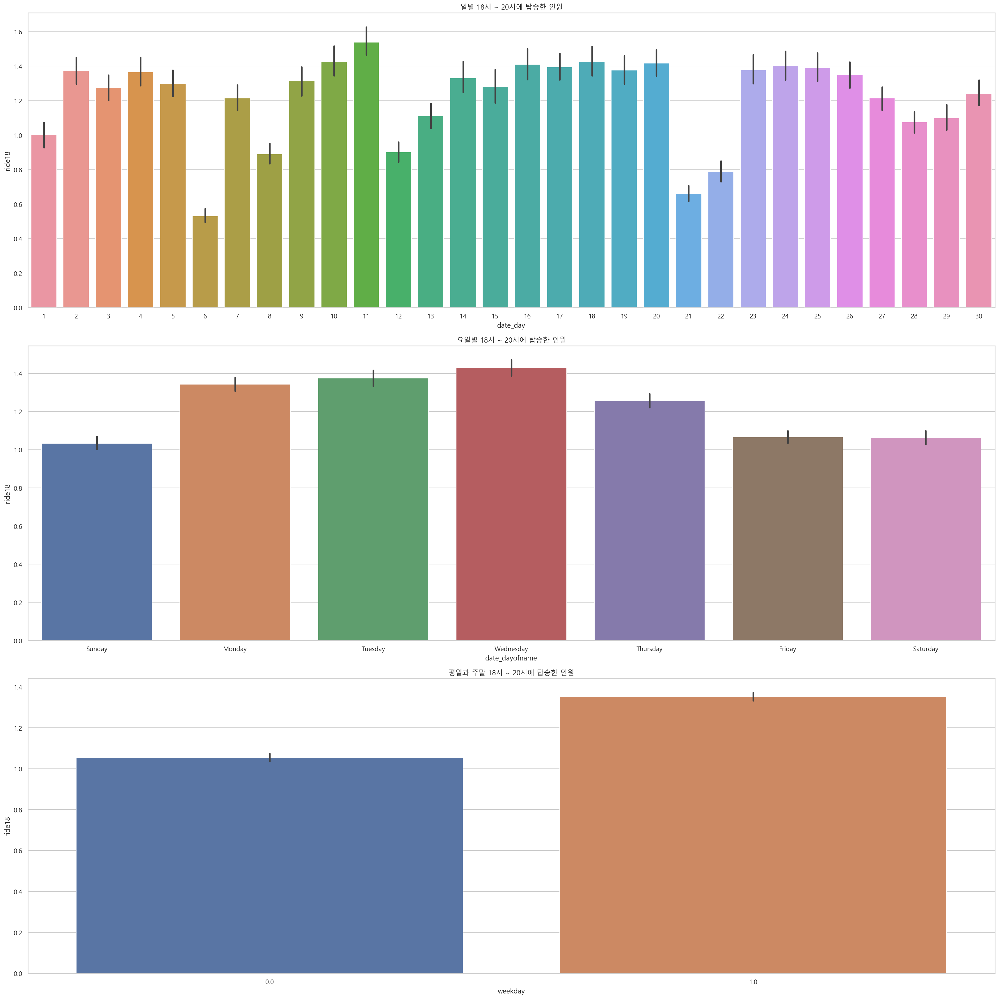

In [250]:
# 일별, 요일별 탑승한 인원 그래프
plt.figure(figsize=(24, 24))

plt.subplot(311)
plt.title('일별 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='date_day', y='ride18', data=train)

plt.subplot(312)
plt.title('요일별 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='date_dayofname', y='ride18', data=train)

plt.subplot(313)
plt.title('평일과 주말 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='weekday', y='ride18', data=train)
plt.tight_layout()
plt.show()

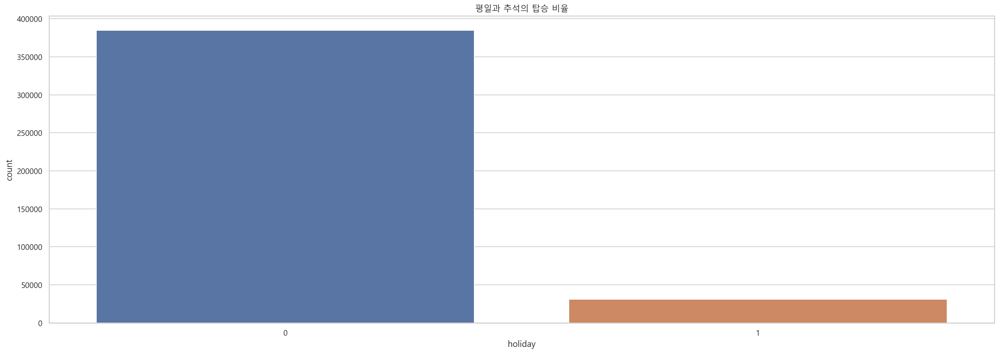

In [251]:
plt.figure(figsize=(24, 8))
sns.countplot(data=train, x= 'holiday')
plt.title('평일과 추석의 탑승 비율')
plt.show()

In [252]:
# 평일과 추석의 비율
train['holiday'].value_counts() / train['holiday'].value_counts().sum() * 100

0    92.605369
1     7.394631
Name: holiday, dtype: float64

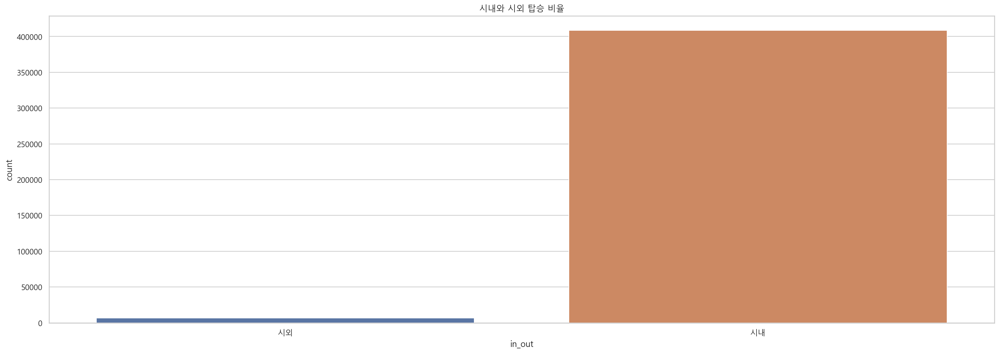

In [253]:
# 시내와 시외 탑승비율
# 제주도의 시는 제주시와 서귀포시를 의미.
# 시외버스는 거의 없다는것을 알수있고, 제주도의 시외버스터미널은 제주시와 서귀포시에 각 한개씩 있음.
# 이자료를 비추어보아, 위도경도를 거리화 할때 제주시와 서귀포시를 나누는것은 의미있을수도 있음.
plt.figure(figsize=(24, 8))
sns.countplot(data=train, x= 'in_out')
plt.title('시내와 시외 탑승 비율')
plt.show()

In [254]:
# 시내와 시외버스 비율 약 98.3과 1.7
train['in_out'].value_counts() / train['in_out'].value_counts().sum() * 100

시내    98.333506
시외     1.666494
Name: in_out, dtype: float64

### 버스노선 분석

In [588]:
# columns 추가 파트로 옴김
# # 일별, 정류장별 버스노선 갯수
# station_table = pd.pivot_table(index=['station_code', 'date'],values='bus_route_id', data=train, aggfunc=len).reset_index()
# station_table.columns = ['station_code', 'date', 'bus_route_id_sum']
# train = pd.merge(train, station_table, how='left', on=['station_code', 'date'])

# # 정류장별 버스노선의 갯수
# station_table = pd.pivot_table(index=['station_code'],values='bus_route_id', data=train, aggfunc=len).reset_index()
# station_table.columns = ['station_code', 'bus_route_id_all_sum']
# train = pd.merge(train, station_table, how='left', on=['station_code'])

# train.tail(2)

In [589]:
station_table = pd.pivot_table(
    index=['station_code'], values='bus_route_id', data=train, aggfunc=len).reset_index()
station_table.columns = ['station_code', 'bus_route_id_all_sum']
sort_table = station_table.sort_values(
    by='bus_route_id_all_sum', ascending=False)
sort_table["encoding"] = list(sort_table.reset_index(drop = True).reset_index(drop = False)["index"])
sort_table

,station_code,bus_route_id_all_sum,encoding
335,358,1610,0
3001,3270,1535,1
334,357,1515,2
3002,3271,1482,3
3009,3278,1423,4
...,...,...,...
760,818,1,3558
3091,3379,1,3559
3093,3382,1,3560
3094,3383,1,3561


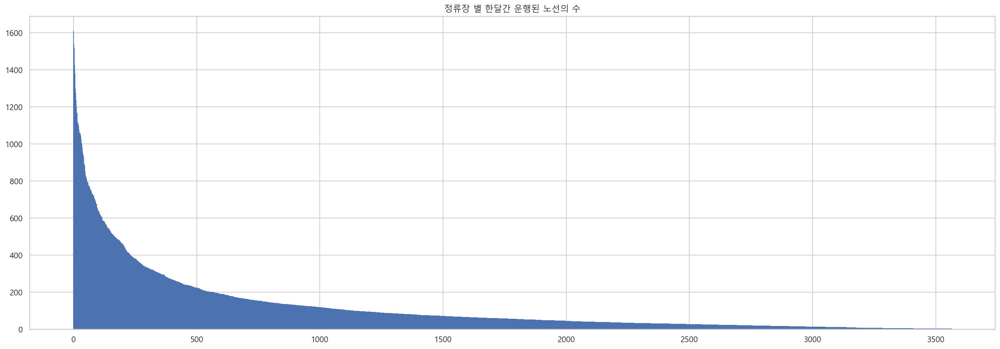

In [590]:
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"]), list(sort_table["bus_route_id_all_sum"]),color = 'b',edgecolor = 'b')
plt.title('정류장 별 한달간 운행된 노선의 수')
plt.show()

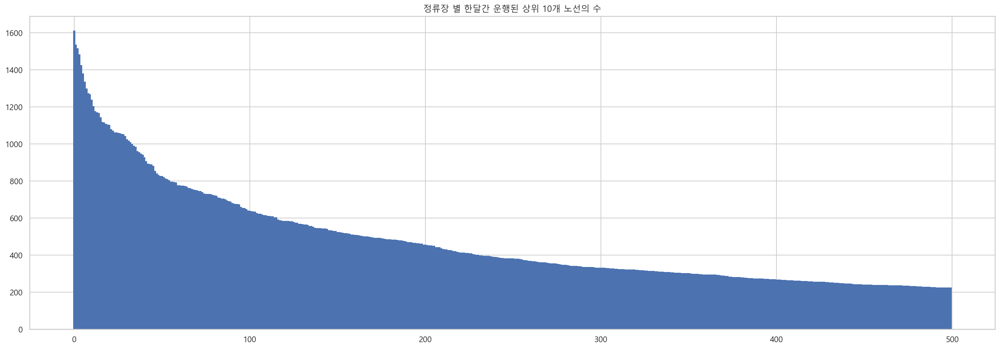

In [591]:
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"][:500]), list(sort_table["bus_route_id_all_sum"][:500]),color = 'b',edgecolor = 'b')
plt.title('정류장 별 한달간 운행된 상위 10개 노선의 수')
plt.show()

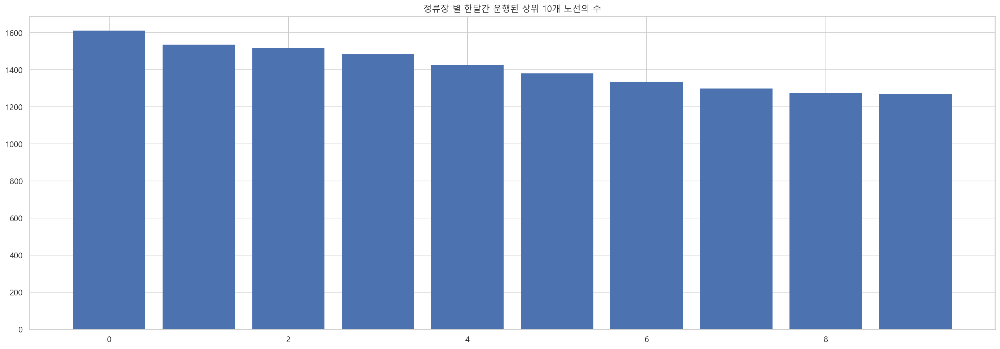

In [592]:
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"][:10]), list(sort_table["bus_route_id_all_sum"][:10]),color = 'b',edgecolor = 'b')
plt.title('정류장 별 한달간 운행된 상위 10개 노선의 수')
plt.show()

### 승하차 인원 분석

In [255]:
# 승하차 인원 피봇테이블 생성
values = ['ride6', 'ride7', 'ride8',
          'ride9', 'ride10', 'ride11', 'off6', 'off7', 'off8', 'off9', 'off10',
          'off11', 'ride18']
values_ride = ['ride6', 'ride7', 'ride8',
               'ride9', 'ride10', 'ride11']
values_off = ['off6', 'off7', 'off8', 'off9', 'off10',
              'off11']

table_all = pd.pivot_table(train, index=['station_name','station_code'], aggfunc=sum, values=values)
table_ride = pd.pivot_table(train, index=['station_name','station_code'], aggfunc=sum, values=values_ride)
table_off = pd.pivot_table(train, index=['station_name','station_code'], aggfunc=sum, values=values_off)
table_ride18 = pd.pivot_table(train, index=['station_name','station_code'], aggfunc=sum, values='ride18')

In [256]:
# 전체 승하차 인원 분석
table_all['all'] = table_all['off10'] + table_all['off11'] + table_all['off6'] + table_all['off7'] + \
    table_all['off8']+table_all['off9'] + table_all['ride18'] + table_all['ride6'] + table_all['ride7'] + \
    table_all['ride8']+table_all['ride9'] + table_all['ride10'] + table_all['ride11']
table_all['percent'] = table_all['all'] / table_all['all'].sum() * 100
table_all

off10  off11  off6  off7   off8   off9  ride10  \
station_name station_code                                                   
(구)구판장       4211            0.0    0.0   0.0   0.0    1.0    0.0    11.0   
             4212            5.0    9.0   0.0   0.0    0.0    0.0     0.0   
(구)중문동주민센터   2058           21.0   25.0   4.0  22.0   35.0   26.0    89.0   
             2059          118.0   45.0   8.0  57.0  103.0  105.0    39.0   
(구)중앙파출소     1952           40.0   52.0  28.0  17.0   51.0   58.0   232.0   
...                          ...    ...   ...   ...    ...    ...     ...   
흥덕사          4199            0.0    1.0   0.0   0.0    1.0    2.0     0.0   
             4200            5.0    2.0   0.0   0.0    0.0    0.0     1.0   
희진주유소        2584           11.0   10.0   1.0   6.0   13.0   12.0    14.0   
             2585            3.0    3.0   0.0   0.0    9.0    2.0    15.0   
히귀반석         503             4.0    2.0   0.0   1.0   13.0    2.0    15.0   

                           ride11  ride18  ride6  ride7  ride8  ride9     all  \
station_name station_code                                                       
(구)구판장       4211             0.0     0.0    0.0   10.0   34.0    6.0    62.0   
             4212             0.0     0.0    0.0    0.0    0.0    0.0    14.0   
(구)중문동주민센터   2058            71.0   132.0   32.0  133.0  179.0  112.0   881.0   
             2059            50.0    83.0   61.0  112.0  136.0   95.0  1012.0   
(구)중앙파출소     1952           160.0   318.0  106.0  105.0   94.0  161.0  1422.0   
...                           ...     ...    ...    ...    ...    ...     ...   
흥덕사          4199             5.0     0.0    0.0    1.0    1.0    5.0    16.0   
             4200             1.0     0.0    0.0    0.0    1.0    0.0    10.0   
희진주유소        2584            13.0     3.0    9.0   28.0   10.0   20.0   150.0   
             2585             8.0    20.0    6.0   59.0   71.0   25.0   221.0   
히귀반석         503              3.0     2.0   21.0   26.0   40.0    4.0   133.0   

                            percent  
station_name station_code            
(구)구판장       4211          0.002064  
             4212          0.000466  
(구)중문동주민센터   2058          0.029330  
             2059          0.033691  
(구)중앙파출소     1952          0.047341  
...                             ...  
흥덕사          4199          0.000533  
             4200          0.000333  
희진주유소        2584          0.004994  
             2585          0.007358  
히귀반석         503           0.004428  

[3563 rows x 15 columns]

In [257]:
# 전체 승하차 인원이 가장 높은 10군데 정류장
# 하위는 ascending옵션을 지우시면 됨
table_all_top_10= table_all.sort_values(by='all',ascending = False)[:10]
table_all_top_10

off10   off11    off6    off7    off8    off9  \
station_name  station_code                                                   
제주시청(광양방면)    3271          2677.0  2834.0   580.0  1519.0  2839.0  2537.0   
제주시청(아라방면)    3270          2866.0  3054.0   993.0  2186.0  3319.0  3115.0   
한라병원          357           2066.0  1714.0   939.0  2035.0  3058.0  2580.0   
              358           1813.0  1468.0   490.0  1991.0  3106.0  2483.0   
제주시외버스터미널     1564            62.0    64.0    24.0    67.0   150.0    77.0   
제주대학교         201            400.0   284.0   114.0   418.0   702.0   309.0   
제주국제공항(구제주방면) 638           1541.0  1597.0  1375.0  2311.0  2463.0  1692.0   
제주버스터미널       149           1684.0  1606.0   842.0  1370.0  1662.0  1609.0   
제주국제공항(종점)    2972          4822.0  4395.0   752.0  5333.0  5724.0  5314.0   
제주국제공항(신제주방면) 1355          1633.0  1780.0  1599.0  2681.0  2115.0  1736.0   

                            ride10  ride11   ride18   ride6   ride7   ride8  \
station_name  station_code                                                    
제주시청(광양방면)    3271          3569.0  4019.0  14206.0  1515.0  2526.0  3583.0   
제주시청(아라방면)    3270          2955.0  2818.0  10375.0  1842.0  3924.0  4461.0   
한라병원          357           3257.0  2923.0   6330.0  1726.0  3043.0  3717.0   
              358           2522.0  2541.0   7614.0   916.0  3052.0  3147.0   
제주시외버스터미널     1564          3828.0  3079.0   5555.0  2944.0  5337.0  4438.0   
제주대학교         201           1907.0  2651.0  17152.0   451.0  1084.0  1651.0   
제주국제공항(구제주방면) 638           1379.0  1512.0   9435.0   246.0  1246.0  1638.0   
제주버스터미널       149           2996.0  2420.0   5907.0   408.0  2008.0  2263.0   
제주국제공항(종점)    2972            79.0    87.0    372.0     7.0    82.0    69.0   
제주국제공항(신제주방면) 1355           970.0  1212.0   8216.0   131.0   736.0  1165.0   

                             ride9      all   percent  
station_name  station_code                             
제주시청(광양방면)    3271          3284.0  45688.0  1.521041  
제주시청(아라방면)    3270          3162.0  45070.0  1.500466  
한라병원          357           3380.0  36768.0  1.224077  
              358           2547.0  33690.0  1.121604  
제주시외버스터미널     1564          4164.0  29789.0  0.991733  
제주대학교         201           1356.0  28479.0  0.948120  
제주국제공항(구제주방면) 638           1994.0  28429.0  0.946456  
제주버스터미널       149           2987.0  27762.0  0.924250  
제주국제공항(종점)    2972           112.0  27148.0  0.903809  
제주국제공항(신제주방면) 1355          1204.0  25178.0  0.838224

In [258]:
# 승차인원 분석
table_ride['ride_all'] = table_ride['ride6'] + table_ride['ride7'] + table_ride['ride8'] + \
    table_ride['ride9'] + table_ride['ride10'] + table_ride['ride11']
table_ride['percent'] = table_ride['ride_all'] / table_ride['ride_all'].sum() * 100
table_ride

ride10  ride11  ride6  ride7  ride8  ride9  \
station_name station_code                                               
(구)구판장       4211            11.0     0.0    0.0   10.0   34.0    6.0   
             4212             0.0     0.0    0.0    0.0    0.0    0.0   
(구)중문동주민센터   2058            89.0    71.0   32.0  133.0  179.0  112.0   
             2059            39.0    50.0   61.0  112.0  136.0   95.0   
(구)중앙파출소     1952           232.0   160.0  106.0  105.0   94.0  161.0   
...                           ...     ...    ...    ...    ...    ...   
흥덕사          4199             0.0     5.0    0.0    1.0    1.0    5.0   
             4200             1.0     1.0    0.0    0.0    1.0    0.0   
희진주유소        2584            14.0    13.0    9.0   28.0   10.0   20.0   
             2585            15.0     8.0    6.0   59.0   71.0   25.0   
히귀반석         503             15.0     3.0   21.0   26.0   40.0    4.0   

                           ride_all   percent  
station_name station_code                      
(구)구판장       4211              61.0  0.003892  
             4212               0.0  0.000000  
(구)중문동주민센터   2058             616.0  0.039307  
             2059             493.0  0.031458  
(구)중앙파출소     1952             858.0  0.054749  
...                             ...       ...  
흥덕사          4199              12.0  0.000766  
             4200               3.0  0.000191  
희진주유소        2584              94.0  0.005998  
             2585             184.0  0.011741  
히귀반석         503              109.0  0.006955  

[3563 rows x 8 columns]

In [259]:
# 승차 인원이 가장 높은 10군데 정류장
table_ride_top10= table_ride.sort_values(by='ride_all',ascending = False)[:10]
table_ride_top10

,,ride10,ride11,ride6,ride7,ride8,ride9,ride_all,percent
station_name,station_code,,,,,,,,
제주시외버스터미널,1564,3828.0,3079.0,2944.0,5337.0,4438.0,4164.0,23790.0,1.518039
제주시청(아라방면),3270,2955.0,2818.0,1842.0,3924.0,4461.0,3162.0,19162.0,1.222727
제주시청(광양방면),3271,3569.0,4019.0,1515.0,2526.0,3583.0,3284.0,18496.0,1.180229
한라병원,357,3257.0,2923.0,1726.0,3043.0,3717.0,3380.0,18046.0,1.151515
시외버스출발지(가상정류소),1565,2626.0,2519.0,1794.0,3063.0,2381.0,2954.0,15337.0,0.978654
한라병원,358,2522.0,2541.0,916.0,3052.0,3147.0,2547.0,14725.0,0.939602
제주버스터미널,149,2996.0,2420.0,408.0,2008.0,2263.0,2987.0,13082.0,0.834762
제주도청신제주로터리,320,2116.0,1893.0,1212.0,2542.0,2838.0,2286.0,12887.0,0.822319
아라주공아파트,124,1515.0,1524.0,1196.0,2592.0,2820.0,1882.0,11529.0,0.735665


In [260]:
# 하차인원 분석
table_off['off_all'] = table_off['off10'] + table_off['off11'] + \
    table_off['off6'] + table_off['off7'] + table_off['off8'] + table_off['off9']
table_off['percent'] = table_off['off_all'] / table_off['off_all'].sum() * 100
table_off

off10  off11  off6  off7   off8   off9  off_all  \
station_name station_code                                                    
(구)구판장       4211            0.0    0.0   0.0   0.0    1.0    0.0      1.0   
             4212            5.0    9.0   0.0   0.0    0.0    0.0     14.0   
(구)중문동주민센터   2058           21.0   25.0   4.0  22.0   35.0   26.0    133.0   
             2059          118.0   45.0   8.0  57.0  103.0  105.0    436.0   
(구)중앙파출소     1952           40.0   52.0  28.0  17.0   51.0   58.0    246.0   
...                          ...    ...   ...   ...    ...    ...      ...   
흥덕사          4199            0.0    1.0   0.0   0.0    1.0    2.0      4.0   
             4200            5.0    2.0   0.0   0.0    0.0    0.0      7.0   
희진주유소        2584           11.0   10.0   1.0   6.0   13.0   12.0     53.0   
             2585            3.0    3.0   0.0   0.0    9.0    2.0     17.0   
히귀반석         503             4.0    2.0   0.0   1.0   13.0    2.0     22.0   

                            percent  
station_name station_code            
(구)구판장       4211          0.000109  
             4212          0.001521  
(구)중문동주민센터   2058          0.014447  
             2059          0.047361  
(구)중앙파출소     1952          0.026722  
...                             ...  
흥덕사          4199          0.000435  
             4200          0.000760  
희진주유소        2584          0.005757  
             2585          0.001847  
히귀반석         503           0.002390  

[3563 rows x 8 columns]

In [261]:
# 하차 인원이 가장 높은 10군데 정류장
table_off_top10= table_off.sort_values(by='off_all',ascending = False)[:10]
table_off_top10

,,off10,off11,off6,off7,off8,off9,off_all,percent
station_name,station_code,,,,,,,,
제주국제공항(종점),2972,4822.0,4395.0,752.0,5333.0,5724.0,5314.0,26340.0,2.861224
제주시청(아라방면),3270,2866.0,3054.0,993.0,2186.0,3319.0,3115.0,15533.0,1.687297
제주버스터미널(종점),2969,2576.0,2748.0,127.0,2279.0,2902.0,2936.0,13568.0,1.473845
중앙로터리,1957,2278.0,1938.0,770.0,2900.0,3059.0,2524.0,13469.0,1.463091
제주시청(광양방면),3271,2677.0,2834.0,580.0,1519.0,2839.0,2537.0,12986.0,1.410625
한라병원,357,2066.0,1714.0,939.0,2035.0,3058.0,2580.0,12392.0,1.346101
제주국제공항(신제주방면),1355,1633.0,1780.0,1599.0,2681.0,2115.0,1736.0,11544.0,1.253985
제주버스터미널,150,1933.0,2448.0,1221.0,1635.0,2003.0,2303.0,11543.0,1.253877
한라병원,358,1813.0,1468.0,490.0,1991.0,3106.0,2483.0,11351.0,1.233020


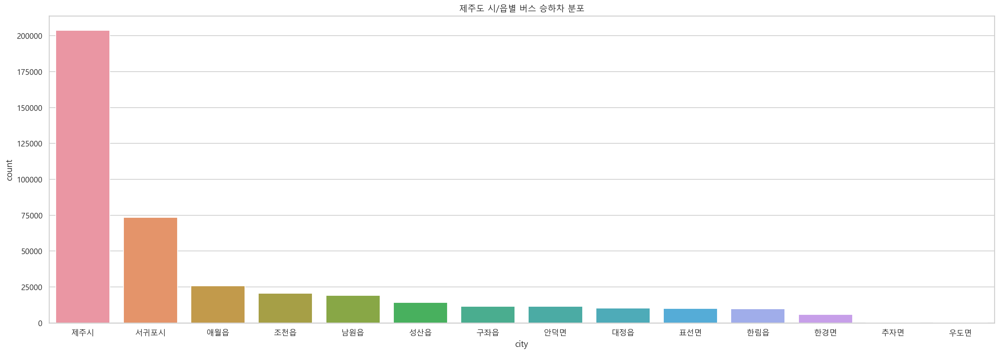

In [262]:
plt.figure(figsize=(24,8))
sns.countplot(train['city'],order = train['city'].value_counts().index)
plt.title('제주도 시/읍별 버스 승하차 분포')
plt.show()

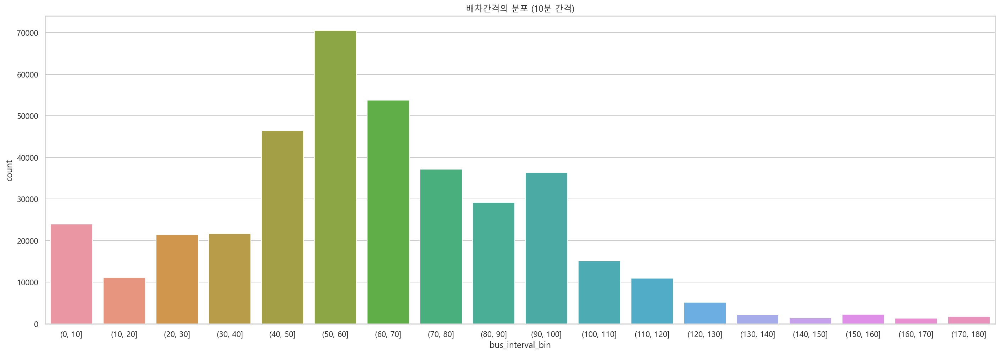

※ 참고 : 23563 개는 배차간격이 매우 큼


In [274]:
interval_df = train[train['bus_interval'] < 999]
interval_df.pivot_table(index='bus_interval', aggfunc=len).reset_index()
bins = list(range(0, 190, 10))
interval_df['bus_interval_bin'] = pd.cut(interval_df['bus_interval'], bins)
interval_df['bus_interval_bin']
plt.figure(figsize=(24, 8))
sns.countplot(interval_df['bus_interval_bin'])
plt.title('배차간격의 분포 (10분 간격)')
plt.show()
print('※ 참고 :',len(train[train['bus_interval'] == 999]),'개는 배차간격이 매우 큼')

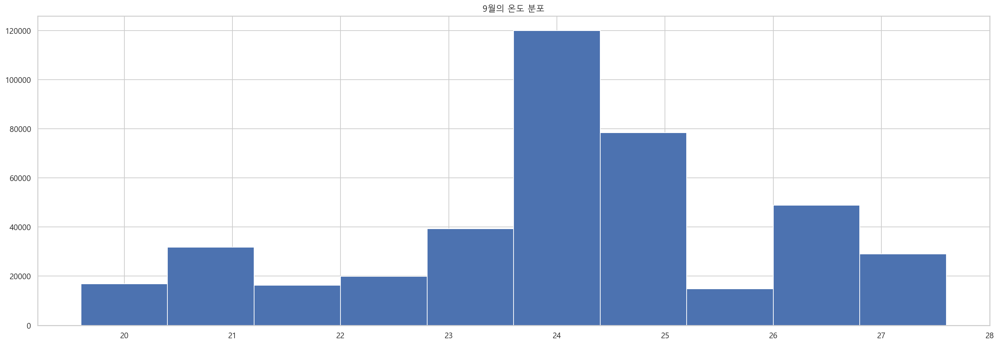

In [453]:
plt.figure(figsize=(24,8))
plt.hist('temperature',data = train)
plt.title('9월의 온도 분포')
plt.show()

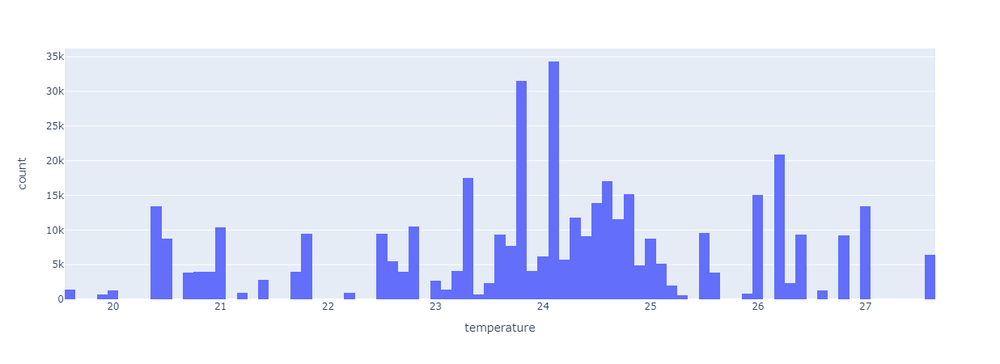

In [42]:
fig = px.histogram(train, x = 'temperature')
fig.show()

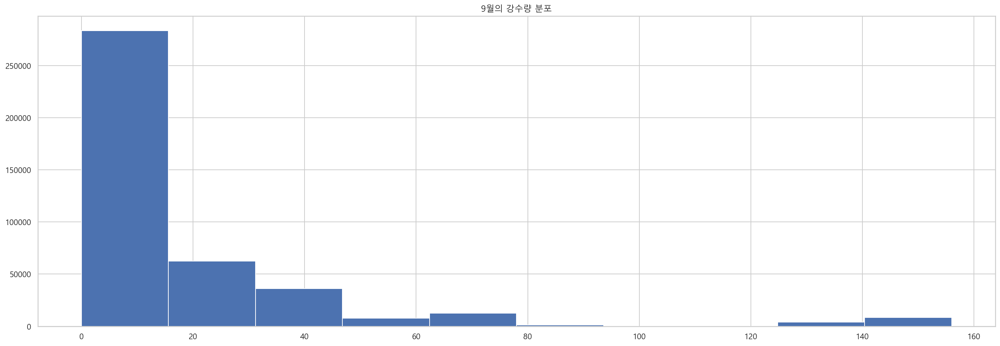

In [474]:
# 강수량 높은건 그날 태풍이 왔음
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = train)
plt.title('9월의 강수량 분포')
plt.show()

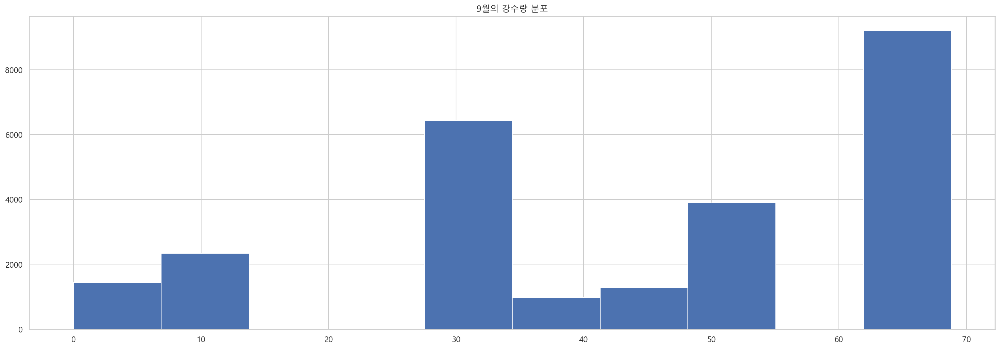

In [498]:
ringring = train[(train['date'] == '2019-09-06') | (train['date'] == '2019-09-07')]
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = ringring)
plt.title('태풍 링링의 강수량 분포')
plt.show()

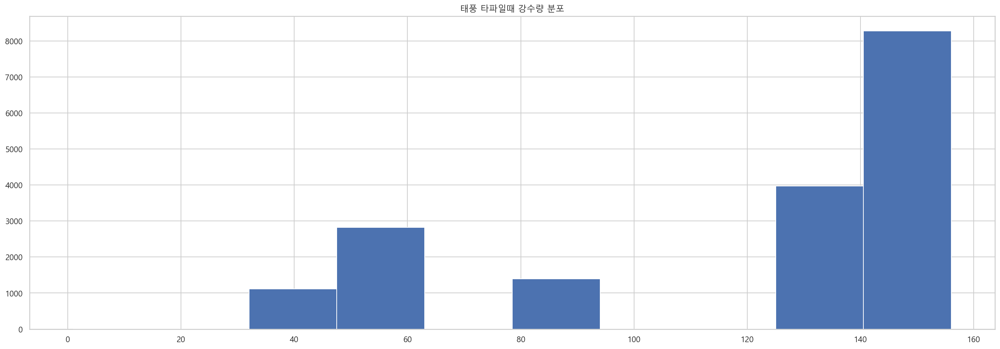

In [502]:
tapa = train[(train['date'] == '2019-09-21') | (train['date'] == '2019-09-22')]
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = tapa)
plt.title('태풍 타파일때 강수량 분포')
plt.show()

태풍이 온날의 탑승인원의 평균은  0.7641931520504439 입니다.
태풍이 오지 않은날의 탑승인원의 평균  1.2974702245048162 입니다.
태풍이 온날의 탑승량의 최고치는  105.0 입니다.
태풍이 오지 않은날의 탑승량의 최고치는  272.0 입니다.


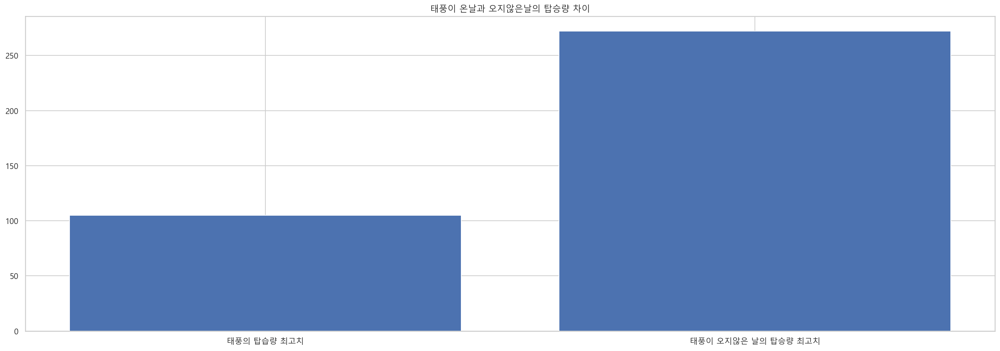

In [562]:
typhoon = train[(train['date'] == '2019-09-06') | (train['date'] == '2019-09-07')
               | (train['date'] == '2019-09-21') | (train['date'] == '2019-09-22')]
not_typhoon = train[(train['date'] != '2019-09-06') & (train['date'] != '2019-09-07')
                   & (train['date'] != '2019-09-21') & (train['date'] != '2019-09-22')]
print('태풍이 온날의 탑승인원의 평균은 ',typhoon.ride18.mean(),'입니다.')
print('태풍이 오지 않은날의 탑승인원의 평균 ',not_typhoon.ride18.mean(),'입니다.')
print('태풍이 온날의 탑승량의 최고치는 ',typhoon.ride18.max(),'입니다.')
print('태풍이 오지 않은날의 탑승량의 최고치는 ',not_typhoon.ride18.max(),'입니다.')
plt.figure(figsize=(24,8))
ad = pd.DataFrame({'강수량':{'태풍의 탑습량 최고치': typhoon.ride18.max(), '태풍이 오지않은 날의 탑승량 최고치': not_typhoon.ride18.max()}}).reset_index()
plt.bar(x = 'index', height = '강수량', data=ad)
plt.title('태풍이 온날과 오지않은날의 탑승량 차이')
plt.show()

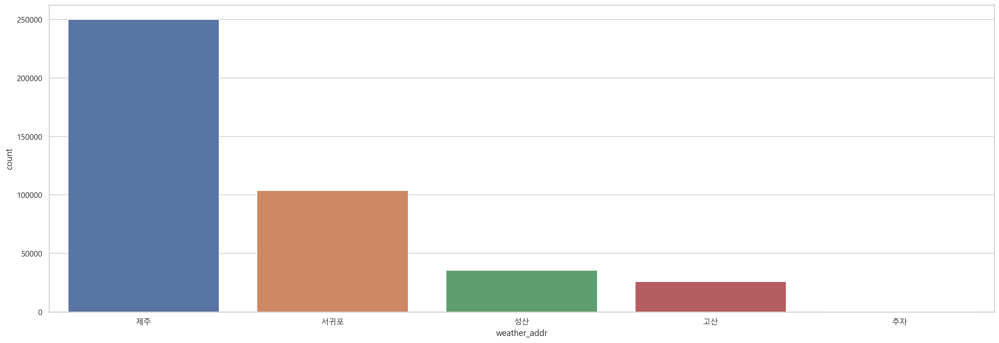

In [40]:
# 날씨를 구분짓는 지역별 countplot
plt.figure(figsize=(24,8))
sns.countplot(train['weather_addr'], order = train['weather_addr'].value_counts().index)
plt.show()

In [593]:
# 상관계수를 구함
train_corr = round(train.corr(),2)
train_corr

,id,bus_route_id,station_code,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,temperature,precipitation,bus_interval,date_day,date_dayofweek,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum
id,1.00,0.04,-0.00,-0.01,-0.00,0.00,0.01,0.01,0.00,-0.00,-0.00,0.00,0.00,0.01,0.01,0.00,-0.00,-0.00,-0.53,-0.12,0.01,1.00,0.05,-0.08,0.08,-0.09,-0.12,0.00,-0.00,0.00,0.01,-0.00,0.00,0.01,0.00,0.00,0.01,0.00,-0.01
bus_route_id,0.04,1.00,-0.02,-0.20,0.01,-0.07,-0.12,-0.13,-0.14,-0.13,-0.13,-0.02,-0.08,-0.10,-0.11,-0.12,-0.11,-0.14,0.01,-0.03,0.16,0.00,-0.02,0.02,-0.02,-0.02,-0.01,0.10,-0.10,-0.12,-0.15,-0.15,-0.08,-0.13,-0.13,-0.17,-0.14,-0.04,-0.05
station_code,-0.00,-0.02,1.00,-0.05,-0.01,0.04,0.06,0.06,0.05,0.05,0.05,-0.00,0.02,0.02,0.02,0.02,0.03,0.03,0.00,-0.01,-0.02,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.09,0.09,0.06,0.06,0.06,0.02,0.03,0.03,0.07,0.03,-0.01,-0.00
latitude,-0.01,-0.20,-0.05,1.00,0.13,0.05,0.07,0.07,0.07,0.06,0.06,0.05,0.05,0.06,0.07,0.06,0.06,0.08,-0.03,0.09,0.01,-0.01,0.01,-0.01,0.01,0.01,0.01,-0.01,0.01,0.07,0.08,0.07,0.06,0.07,0.07,0.09,0.08,0.29,0.31
longitude,-0.00,0.01,-0.01,0.13,1.00,-0.01,-0.02,-0.02,-0.01,-0.01,-0.01,-0.01,-0.02,-0.03,-0.01,-0.01,-0.01,-0.02,0.02,0.01,-0.05,0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.07,-0.07,-0.02,-0.02,-0.01,-0.02,-0.03,-0.01,-0.02,-0.02,-0.02,-0.02
ride6,0.00,-0.07,0.04,0.05,-0.01,1.00,0.38,0.30,0.31,0.28,0.27,0.13,0.03,0.02,0.03,0.03,0.03,0.26,-0.00,-0.01,0.00,0.00,-0.04,0.03,-0.03,-0.01,-0.02,-0.03,0.03,0.68,0.35,0.31,0.08,0.03,0.03,0.51,0.05,0.12,0.12
ride7,0.01,-0.12,0.06,0.07,-0.02,0.38,1.00,0.48,0.43,0.40,0.39,0.07,0.18,0.13,0.11,0.12,0.14,0.37,-0.00,-0.03,-0.04,0.01,-0.10,0.09,-0.09,-0.06,-0.04,-0.01,0.01,0.93,0.52,0.45,0.18,0.14,0.14,0.73,0.18,0.13,0.12
ride8,0.01,-0.13,0.06,0.07,-0.02,0.30,0.48,1.00,0.51,0.46,0.45,0.09,0.12,0.30,0.19,0.18,0.21,0.45,0.00,-0.02,-0.08,0.01,-0.06,0.06,-0.06,-0.04,-0.03,-0.02,0.02,0.49,0.89,0.52,0.14,0.30,0.22,0.77,0.28,0.15,0.15
ride9,0.00,-0.14,0.05,0.07,-0.01,0.31,0.43,0.51,1.00,0.54,0.52,0.13,0.14,0.19,0.34,0.25,0.24,0.49,0.00,-0.01,-0.08,0.01,-0.03,0.03,-0.03,-0.02,-0.02,-0.03,0.03,0.46,0.84,0.60,0.17,0.31,0.28,0.77,0.32,0.15,0.15
ride10,-0.00,-0.13,0.05,0.06,-0.01,0.28,0.40,0.46,0.54,1.00,0.54,0.12,0.14,0.20,0.24,0.36,0.27,0.51,0.01,-0.01,-0.08,0.00,-0.01,0.01,-0.01,-0.01,-0.02,-0.03,0.03,0.42,0.57,0.87,0.17,0.26,0.36,0.75,0.33,0.15,0.16


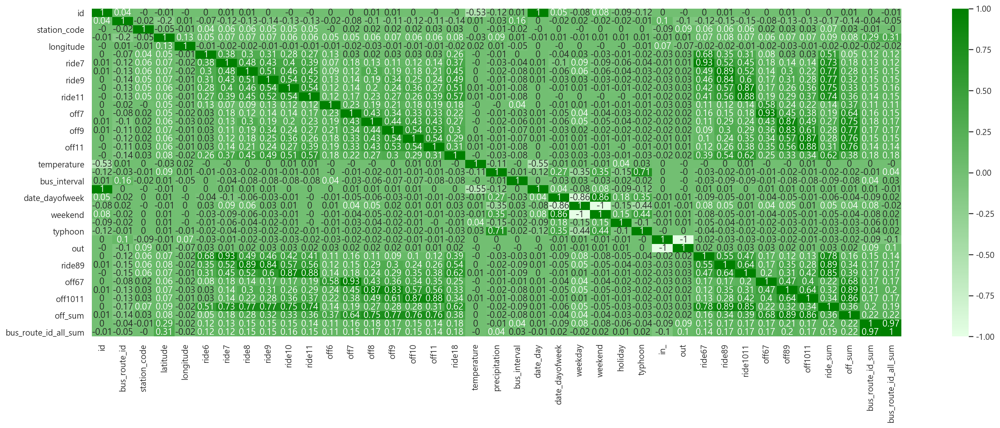

In [594]:
# 상관계수의 heatmap
plt.figure(figsize=(24, 8))
sns.heatmap(train_corr, annot=True, cmap=sns.light_palette("green", as_cmap=True))
plt.show()

In [4]:
# Passengers = ['ride6','ride7','ride8','ride9','ride10','ride11','off6','off7','off8','off9','off10','off11','ride18']
# for Passenger in Passengers:
#     print(f'{Passenger}의 최소 인원은{train[Passenger].min()}명 이고 최대 인원은 {train[Passenger].max()}명 입니다.')

In [36]:
# # 한달에 30번이하로 운행하는 정류소 갯수
# (train['station_code'].value_counts().sort_values(ascending = True) <= 29).sum()

In [37]:
# train['station_code'].value_counts()

In [38]:
# # 한달에 30회 미만 운행하는 정류장구하기
# outlier = pd.DataFrame(train['station_code'].value_counts().sort_values(ascending = True)).reset_index()
# outlier.columns = ['station_code', 'times']
# outlier = outlier[outlier['times'] <= 29]
# outlier

In [41]:
# # 한달에 30번 미만 운행하는 정류장의 count플롯
# plt.figure(figsize=(24,10))
# sns.countplot(x ='times', data = outlier,edgecolor='b', color='b')
# plt.show()

In [29]:
# # 한달에 30번 미만 운행하는 정류소는 아웃라이어로 삭제
# train_test = train.copy()
# for i in outlier['station_code'] :
#     train_test = train_test[train_test['station_code'] != i]
# train_test

In [30]:
# train_test['station_code'].value_counts()

In [31]:
# 최종 399541 rows × 29 columns

In [32]:
# # 한달에 30번이하로 운행하는 노선 갯수
# (train['bus_route_id'].value_counts().sort_values(ascending = True) == 1).sum()

In [33]:
# # 한달에 30회 미만 운행하는 노선 구하기
# outlier = pd.DataFrame(train['bus_route_id'].value_counts().sort_values(ascending = True)).reset_index()
# outlier.columns = ['bus_route_id', 'times']
# outlier = outlier[outlier['times'] == 1]
# outlier

In [34]:
# # 한달에 30번 미만 운행하는 노선은 아웃라이어로 삭제
# train_test = train_test.copy()
# for i in outlier['bus_route_id'] :
#     train_test = train_test[train_test['bus_route_id'] != i]
# train_test

In [597]:
# 415423 rows × 49 columns
train = train.sort_values('id').reset_index(drop = True)
train.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 애월리 1534-2,제주시,애월읍,애월리,애월로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,5,120
415422,415422,2019-09-30,32820000,시내,6115100,서귀포시외버스터미널,33.24873,126.50799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 법환동 843,서귀포시,서귀포시,법환동,일주동로,서귀포,24.3,6.3,8.0,30,0,Monday,1.0,0.0,0,0,1,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,15,440


In [598]:
# 데이터 저장
train.to_csv('raw_train.csv',encoding='utf-8',index = False)

## 데이터 분리 후 모델 학습 및 검증

In [4]:
#데이터 불러오기
# 415423 rows × 49 columns
raw_train = pd.read_csv('raw_train.csv')
raw_train

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum
0,0,2019-09-01,4270000,시외,344,제주썬호텔,33.48990,126.49373,0.0,1.0,2.0,5.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 연동 291,제주시,제주시,연동,삼무로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,1.0,7.0,8.0,0.0,0.0,0.0,16.0,0.0,1,30
1,1,2019-09-01,4270000,시외,357,한라병원,33.48944,126.48508,1.0,4.0,4.0,2.0,5.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,제주특별자치도 제주시 연동 2335-4,제주시,제주시,연동,도령로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,5.0,6.0,11.0,0.0,0.0,0.0,22.0,0.0,45,1515
2,2,2019-09-01,4270000,시외,432,정존마을,33.48181,126.47352,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,제주특별자치도 제주시 노형동 2617-2,제주시,제주시,노형동,노형로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,2.0,2.0,0.0,0.0,0.0,0.0,4.0,0.0,21,749
3,3,2019-09-01,4270000,시내,1579,제주국제공항(600번),33.50577,126.49252,0.0,17.0,6.0,26.0,14.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,제주특별자치도 제주시 용담이동 833-2,제주시,제주시,용담이동,공항로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,17.0,32.0,30.0,0.0,0.0,0.0,79.0,0.0,1,31
4,4,2019-09-01,4270000,시내,1646,중문관광단지입구,33.25579,126.41260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,제주특별자치도 서귀포시 색달동 2551-3,서귀포시,서귀포시,색달동,천제연로,서귀포,22.6,18.7,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,10,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415418,415418,2019-09-30,32820000,시내,1129,한림환승정류장(한림리),33.41437,126.26336,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한림읍 한림리 1360-2,제주시,한림읍,한림리,한림로,고산,23.7,38.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,4.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,17,463
415419,415419,2019-09-30,32820000,시내,1564,제주시외버스터미널,33.49946,126.51479,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 오라일동 2441-4,제주시,제주시,오라일동,서광로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,4.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,23,719
415420,415420,2019-09-30,32820000,시내,2322,해병부대,33.23100,126.26273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 대정읍 상모리 4165,서귀포시,대정읍,상모리,일주서로,고산,23.7,38.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,9,184
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 애월리 1534-2,제주시,애월읍,애월리,애월로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,5,120


In [622]:
# 9월 1일 ~ 9월 21일 = train
# 9월 22일 ~ 9월 30일 = test
# 학습 및 검증은 train으로하고 test는 실제 모델에 사용해봄
df_train = raw_train[raw_train['date']  <= '2019-09-21']
df_test = raw_train[raw_train['date']  >= '2019-09-22']

In [624]:
# a = train[train['bus_route_id'] == 31040000]
# b = train[train['bus_route_id'] == 28800000]
# train = pd.concat([train, a])
# train = pd.concat([train, b])
# train

In [625]:
# train.bus_route_id.value_counts()

In [626]:
# # tecolumns train의 비율 및 정류소의 갯수 (둘다 동일하게 들어갔는지.)
# for i in range(1000,1500):
#     df_train, df_test = train_test_split(train, test_size=0.2, random_state=i)# 1번 운행한 노선 복제하면 1446, 안하면 1093
# #     print('train의 비율:', len(df_train) / len(train))
# #     print('test의 비율:', len(df_test) / len(train))
#     print(i)
#     print('전체의 정류소 갯수:', len(train['station_code'].unique()),end='\t',)
#     print('train의 정류소 갯수:', len(df_train['station_code'].unique()),end='\t',)
#     print('차이 :',len(train['station_code'].unique())-len(df_train['station_code'].unique()),end='\t',)
#     print('')
# #     print('test의 정류소 갯수:', len(df_test['station_code'].unique()))
# #     print('train의 노선 갯수:', len(df_train['bus_route_id'].unique()))
# #     print('test의 노선 갯수:', len(df_test['bus_route_id'].unique()))

In [627]:
## test를 랜덤하게 자르기
# df_train, df_test = train_test_split(train, test_size=0.2, random_state=1326) #1번 운행하는 노선 복제하면 1446, 아니면 1326
# print('전체의 정류소 갯수:', len(train['station_code'].unique()),end='\t',)
# print('train의 정류소 갯수:', len(df_train['station_code'].unique()),end='\t',)
# print('차이 :',len(train['station_code'].unique())-len(df_train['station_code'].unique()),end='\t',)

In [628]:
# test에는 있는데, train에는 없는 정류장
y = list(set(df_test['station_code'].unique()) - set(df_train['station_code'].unique()))
print(len(y))

32


In [629]:
# train에 없는 정류장을 train에 넣기
for i in y:
    t = df_test[df_test['station_code'] == i]
    df_train = pd.concat([df_train,t])

In [630]:
print('전체의 정류소 갯수:', len(raw_train['station_code'].unique()),end='\t',)
print('train의 정류소 갯수:', len(df_train['station_code'].unique()),end='\t',)
print('차이 :',len(raw_train['station_code'].unique())-len(df_train['station_code'].unique()),end='\t',)

전체의 정류소 갯수: 3563	train의 정류소 갯수: 3563	차이 : 0	

In [631]:
# test에는 있는데, train에는 없는 노선
y = list(set(df_test['bus_route_id'].unique()) - set(df_train['bus_route_id'].unique()))
print(len(y))

8


In [632]:
# train에 없는 노선을 train에 넣기
for i in y:
    t = df_test[df_test['bus_route_id'] == i]
    df_train = pd.concat([df_train,t])

In [633]:
# # 비정기적으로 운행하는 노선 삭제
# df_train = df_train.copy()
# for i in y :
#     df_train = df_train[df_train['bus_route_id'] != i]
# df_train

In [634]:
# # 한달에 비정기적으로 운행하는 노선 확인
# y = list(set(df_test['bus_route_id'].unique()) - set(df_train['bus_route_id'].unique()))
# print(len(y))
# y

In [635]:
# # 비정기적으로 운행하는 노선 삭제
# df_test = df_test.copy()
# for i in y :
#     df_test = df_test[df_test['bus_route_id'] != i]
# df_test

In [636]:
# test와 train의 비율 및 정류소의 갯수 (둘다 동일하게 들어갔는지.)
print('train의 비율:', len(df_train) / len(raw_train))
print('test의 비율:', len(df_test) / len(raw_train))
print('전체의 정류소 갯수:', len(raw_train['station_code'].unique()))
print('전체의 노선 갯수:', len(raw_train['bus_route_id'].unique()))
print('train의 정류소 갯수:', len(df_train['station_code'].unique()))
print('test의 정류소 갯수:', len(df_test['station_code'].unique()))
print('train의 노선 갯수:', len(df_train['bus_route_id'].unique()))
print('test의 노선 갯수:', len(df_test['bus_route_id'].unique()))

train의 비율: 0.6959580957241174
test의 비율: 0.304299473067211
전체의 정류소 갯수: 3563
전체의 노선 갯수: 613
train의 정류소 갯수: 3563
test의 정류소 갯수: 3417
train의 노선 갯수: 613
test의 노선 갯수: 582


#### 만일 아래에서 노선의 갯수가 train과 테스트가 안맞는다고하면 반대도 한번 더 진행해줄필요가있음

In [637]:
df_train.columns

Index(['id', 'date', 'bus_route_id', 'in_out', 'station_code', 'station_name',
       'latitude', 'longitude', 'ride6', 'ride7', 'ride8', 'ride9', 'ride10',
       'ride11', 'off6', 'off7', 'off8', 'off9', 'off10', 'off11', 'ride18',
       '지번주소', 'si', 'city', 'dong', 'road_addr', 'weather_addr',
       'temperature', 'precipitation', 'bus_interval', 'date_day',
       'date_dayofweek', 'date_dayofname', 'weekday', 'weekend', 'holiday',
       'typhoon', 'in_', 'out', 'ride67', 'ride89', 'ride1011', 'off67',
       'off89', 'off1011', 'ride_sum', 'off_sum', 'bus_route_id_sum',
       'bus_route_id_all_sum'],
      dtype='object')

In [638]:
df_train

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum
0,0,2019-09-01,4270000,시외,344,제주썬호텔,33.48990,126.49373,0.0,1.0,2.0,5.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 연동 291,제주시,제주시,연동,삼무로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,1.0,7.0,8.0,0.0,0.0,0.0,16.0,0.0,1,30
1,1,2019-09-01,4270000,시외,357,한라병원,33.48944,126.48508,1.0,4.0,4.0,2.0,5.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,제주특별자치도 제주시 연동 2335-4,제주시,제주시,연동,도령로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,5.0,6.0,11.0,0.0,0.0,0.0,22.0,0.0,45,1515
2,2,2019-09-01,4270000,시외,432,정존마을,33.48181,126.47352,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,제주특별자치도 제주시 노형동 2617-2,제주시,제주시,노형동,노형로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,2.0,2.0,0.0,0.0,0.0,0.0,4.0,0.0,21,749
3,3,2019-09-01,4270000,시내,1579,제주국제공항(600번),33.50577,126.49252,0.0,17.0,6.0,26.0,14.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,제주특별자치도 제주시 용담이동 833-2,제주시,제주시,용담이동,공항로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,17.0,32.0,30.0,0.0,0.0,0.0,79.0,0.0,1,31
4,4,2019-09-01,4270000,시내,1646,중문관광단지입구,33.25579,126.41260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,제주특별자치도 서귀포시 색달동 2551-3,서귀포시,서귀포시,색달동,천제연로,서귀포,22.6,18.7,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,10,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309593,309593,2019-09-23,32090000,시내,2054,중문동,33.25155,126.42690,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 중문동 2774,서귀포시,서귀포시,중문동,천제연로,서귀포,20.9,0.6,999.0,23,0,Monday,1.0,0.0,0,0,1,0,4.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,24,581
309594,309594,2019-09-23,32090000,시내,2057,중문초등학교,33.25135,126.42988,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 중문동 2774,서귀포시,서귀포시,중문동,천제연로,서귀포,20.9,0.6,999.0,23,0,Monday,1.0,0.0,0,0,1,0,3.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,25,607
309595,309595,2019-09-23,32090000,시내,2058,(구)중문동주민센터,33.25103,126.43435,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 중문동 2774,서귀포시,서귀포시,중문동,천제연로,서귀포,20.9,0.6,999.0,23,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,11,263
309596,309596,2019-09-23,32090000,시내,2806,돔뱅이왓,33.23500,126.36950,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 하예동 1810-1,서귀포시,서귀포시,하예동,예래로,서귀포,20.9,0.6,999.0,23,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3,77


In [639]:
# 데이터 스케일링
# 위에서 변수가 추가되면 여기에도 넣어야 함.
values = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11', 'off6', 'off7', 'off8',
          'off9', 'off10', 'off11', 'ride18', 'temperature', 'precipitation', 'bus_interval',
          'ride67', 'ride89', 'ride1011', 'off67', 'off89', 'off1011', 'ride_sum', 'off_sum',
          'bus_route_id_sum', 'bus_route_id_all_sum']

scale_values = [f'scale_{value}' for value in values]

df_train[scale_values] = df_train[values]
df_test[scale_values] = df_test[values]

X = df_train[scale_values]
Y = df_test[scale_values]

scaler = StandardScaler()
scaler.fit(X)

X_scaler = scaler.transform(X)
Y_scaler = scaler.transform(Y)

df_train[scale_values] = X_scaler
df_test[scale_values] = Y_scaler

In [227]:
# 한달에 하위 20개 확인
# train_test["bus_route_id"].value_counts().reset_index(name = "count")[-20:]

In [228]:
# 버스루트 확인
# plt.plot(train_test["bus_route_id"].value_counts().reset_index(name = "count")["count"])

In [214]:
# # 테스트 데이터 프레임 나누기
# # 간략화 하기 위해 데이터 프레임에서 정류장코드 몇개만 가져오기
# # 백업

# def split(num, seed):
#     test_frame = pd.DataFrame(columns=df_train.columns)
#     np.random.seed(seed)

#     for i in np.random.choice(df_train['station_code'].unique(), num, replace=False):
#         df1 = df_train[df_train['station_code'] == i]
#         test_frame = pd.concat([test_frame, df1])
#     return test_frame

# # 모델 돌리기
# def ols_trian_test(test_frame, seed, var, cate):
    
#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     # cate_c = [f"C({name}, levels=all_{name})" for name in cate]
#     cate_c = [f"C({name})" for name in cate]
#     # var_s = [f"scale({name})" for name in var]
#     # y = ['ride18']
#     y = ['scale_ride18']

#     # 데이터를 받아, 스테이션 코드 1개만 출력하여 
#     for i in test_frame['station_code'].unique():
#         # df1로 저장
#         df1 = test_frame[test_frame['station_code'] == i]
#         # df1을 id 갯수로 피벗테이블 변경
#         table = df1.pivot_table(index=['bus_route_id'], values=['id'], aggfunc=len).reset_index()
#         # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
#         table = table[table['id'] == 1]
#         # 데이터라는 빈데이터프레임을 만들고
#         data = pd.DataFrame(columns=columns)
#         # id가 1인 테이블에서 
#         for rid in table['bus_route_id']:
#             # 1인 데이터만 data 프레임에 저장
#             data = data.append(df1[df1['bus_route_id'] == rid],ignore_index = True)
#         # df1과 data 프레임을 합침    
#         df1 = pd.concat([df1,data]).reset_index(drop=True)

#         # 정류소별로 테스트와 나누기
#         # 빈 리스트 2개를 만들고
#         ls_idx_1 = []
#         ls_idx_2 = []
#             # 앞에서 만든 df1의 버스 아이디를 가져와서
#         for num in df1["bus_route_id"].unique():
#             #df1의 버스 루트아이디의 인덱스를 idx변수에 담고
#             idx = df1[df1["bus_route_id"] == num].index
#             # idx1과 idx2로 2등분 해줌 (8:2 수준)
#             idx_1 = np.random.choice(idx, int(len(idx) *0.8), replace=False)
#             idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
#             # 리스트에 차곡차곡 다 저장
#             ls_idx_1 += list(idx_1)
#             ls_idx_2 += list(idx_2)
#             # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
#             idx_1_df = df1.loc[ls_idx_1]
#             idx_2_df = df1.loc[ls_idx_2]


#         # 모델 학습    
#         sample = idx_1_df
#         sample_model = sample[var+y+cate] # 트레인 모델
#         # 모델 포뮬라
#         model = sm.OLS.from_formula(
#         'scale_ride18  ~ ' + '+'.join(var)
#         + '+'.join('+') + '+'.join(cate_c), data=sample_model)
#         # 학습
#         result = model.fit()
#         # 결과
#         sample['yhat'] = result.predict(sample_model)
#         # 학습 저장
#         df_tr = pd.concat([df_tr, sample])

#         # 테스트 모델 가져오기 

#         sample2 = idx_2_df
#         sample2_model = sample2[var+cate] #테스트 모델
#         # 테스트 모델 예측
#         sample2['yhat'] = result.predict(sample2_model)
#         # 테스트 저장
#         df_te = pd.concat([df_te, sample2])
            
#     return df_tr, df_te

# def ols_trian_test_save(test_frame, seed, var, cate):
    
#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     cate_c = [f"C({name})" for name in cate]
#     # var_s = [f"scale({name})" for name in var]
#     y = ['scale_ride18']
# #     y = ['ride18']

#     # 데이터를 받아, 스테이션 코드 1개만 출력하여 
#     for i in test_frame['station_code'].unique():
#         # df1로 저장
#         df1 = test_frame[test_frame['station_code'] == i]
#         # df1을 id 갯수로 피벗테이블 변경
#         table = df1.pivot_table(index=['bus_route_id'], values=['id'], aggfunc=len).reset_index()
#         # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
#         table = table[table['id'] == 1]
#         # 데이터라는 빈데이터프레임을 만들고
#         data = pd.DataFrame(columns=test_frame.columns)
#         # id가 1인 테이블에서 
#         for rid in table['bus_route_id']:
#             # 1인 데이터만 data 프레임에 저장
#             data = data.append(df1[df1['bus_route_id'] == rid],ignore_index = True)
#         # df1과 data 프레임을 합침    
#         df1 = pd.concat([df1,data]).reset_index(drop=True)

#         # 정류소별로 테스트와 나누기
#         # 빈 리스트 2개를 만들고
#         ls_idx_1 = []
#         ls_idx_2 = []
#             # 앞에서 만든 df1의 버스 아이디를 가져와서
#         for num in df1["bus_route_id"].unique():
#             #df1의 버스 루트아이디의 인덱스를 idx변수에 담고
#             idx = df1[df1["bus_route_id"] == num].index
#             # idx1과 idx2로 2등분 해줌 (8:2 수준)
#             idx_1 = np.random.choice(idx, int(len(idx) *0.8), replace=False)
#             idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
#             # 리스트에 차곡차곡 다 저장
#             ls_idx_1 += list(idx_1)
#             ls_idx_2 += list(idx_2)
#             # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
#             idx_1_df = df1.loc[ls_idx_1]
#             idx_2_df = df1.loc[ls_idx_2]

#             # 모델 학습
#         sample = idx_1_df
#         sample_model = idx_1_df[var+y+cate] # 트레인 모델
#         # 모델 포뮬라
#         model = sm.OLS.from_formula(
#         'scale_ride18  ~ ' + '+'.join(var)
#         + '+'.join('+') + '+'.join(cate_c), data=sample_model)
#         # 학습
#         result = model.fit()
#         # 결과
#         sample['yhat'] = result.predict(sample_model)

#         # Save pickle (쥬피터노트북 있는 폴더 아래 model이라는 폴더를 만들어야 저장돼요)
#         name = 'model/'+str(i) + '.pkl'
#         with open(name,"wb") as fw:
#             pickle.dump(result, fw)

#         # 학습 저장
#         df_tr = pd.concat([df_tr, sample])

#         # 테스트 모델 가져오기 
#         sample2 = idx_2_df
#         sample2_model = idx_2_df[var+cate] #테스트 모델

#         # 테스트 모델 예측
#         # Load pickle
#         name = 'model/'+str(i) + '.pkl'
#         with open(name,"rb") as fr:
#             result = pickle.load(fr)           
#         sample2['yhat'] = result.predict(sample2_model)

#         # 테스트 저장
#         df_te = pd.concat([df_te, sample2])
#     return df_tr, df_te

In [212]:
# # 테스트 데이터 프레임 나누기
# # 사이킷런으로 해보기
# # 간략화 하기 위해 데이터 프레임에서 정류장코드 몇개만 가져오기

# def split(num, seed):
#     test_frame = pd.DataFrame(columns=df_train.columns)
#     np.random.seed(seed)
    
#     for i in np.random.choice(df_train['station_code'].unique(), num, replace=False):
#         df1 = df_train[df_train['station_code'] == i]
#         test_frame = pd.concat([test_frame, df1])
#     return test_frame


# def ols_trian_test(test_frame, seed, var, cate):

#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     result = LinearRegression()
    
#     table = test_frame.pivot_table(index=['station_code'], values=['id'], aggfunc=len).reset_index()
#     # 변경된 피벗테이블에서 id의  1(정류장이 1개인것과 동일)한것을 table에 저장
#     table = table[table['id'] == 1]
#     # 데이터라는 빈데이터프레임을 만들고
#     data = pd.DataFrame(columns=test_frame.columns)
#     # id가 1인 테이블에서
#     for num in table['station_code']:
#         # 1인 데이터만 data 프레임에 저장
#         data = data.append(test_frame[test_frame['station_code'] == num], ignore_index=True)
#     # df1과 data 프레임을 합침
#     test_frame = pd.concat([test_frame, data]).reset_index(drop=True)

#     for i in test_frame['station_code'].unique():
#         y = ['ride18']
        
#         df1 = test_frame[test_frame['station_code'] == i]
        
#         sample, sample2 = train_test_split(df1, test_size=0.2)
#         X = sample[var+cate]
#         y = sample[y]
        
#         result.fit(X, y)
#         sample['yhat'] = result.predict(X)
#         df_tr = pd.concat([df_tr, sample])

#         sample2_model = sample2[var+cate]
#         sample2['yhat'] = result.predict(sample2_model)
#         df_te = pd.concat([df_te, sample2])

#     return df_tr, df_te

# def ols_trian_test_save(test_frame, seed, var, cate):
#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     result = LinearRegression()
    
#     # 1개인 정류장을 찾기위해 일단 pivot을 만듬
#     table = test_frame.pivot_table(index=['station_code'], values=['id'], aggfunc=len).reset_index()
#     # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
#     table = table[table['id'] == 1]
#     # 데이터라는 빈데이터프레임을 만들고
#     data = pd.DataFrame(columns=test_frame.columns)
#     # id가 1인 테이블에서
#     for num in table['station_code']:
#         # 1인 데이터만 data 프레임에 저장
#         data = data.append(test_frame[test_frame['station_code'] == num], ignore_index=True)
#     # df1과 data 프레임을 합침
#     test_frame = pd.concat([test_frame, data]).reset_index(drop=True)
    
#     for i in test_frame['station_code'].unique():
#         y = ['ride18']
#         df1 = test_frame[test_frame['station_code'] == i]
#         sample, sample2 = train_test_split(df1, test_size=0.2)
#         X = sample[var+cate]
#         y = sample[y]
#         result.fit(X, y)
#         sample['yhat'] = result.predict(X)

#         # Save pickle (쥬피터노트북 있는 폴더 아래 model이라는 폴더를 만들어야 저장돼요)
#         name = 'model/'+str(i) + '.pkl'
#         with open(name, "wb") as fw:
#             pickle.dump(result, fw)
#         df_tr = pd.concat([df_tr, sample])

#         # ## Load pickle
#         name = 'model/'+str(i) + '.pkl'
#         with open(name, "rb") as fr:
#             result = pickle.load(fr)

#         sample2_model = sample2[var+cate]
#         sample2['yhat'] = result.predict(sample2_model)
#         df_te = pd.concat([df_te, sample2])

#     return df_tr, df_te

In [216]:
# # 테스트 데이터 프레임 나누기
# # 간략화 하기 위해 데이터 프레임에서 정류장코드 몇개만 가져오기

# def split(num, seed):
#     test_frame = pd.DataFrame(columns=df_train.columns)
#     np.random.seed(seed)

#     for i in np.random.choice(df_train['station_code'].unique(), num, replace=False):
#         df1 = df_train[df_train['station_code'] == i]
#         test_frame = pd.concat([test_frame, df1])
#     return test_frame

# # 모델 돌리기
# def ols_trian_test(test_frame, seed, var, cate):
    
#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     cate_c = [f"C({name})" for name in cate]
#     cate_c = [f'C({name},levels=["{name}0", "{name}1"])' for name in cate]
#     # var_s = [f"scale({name})" for name in var]
#     # y = ['ride18']
#     y = ['scale_ride18']

#     # 데이터를 받아, 스테이션 코드 1개만 출력하여 
#     for i in test_frame['station_code'].unique():
#         # df1로 저장
#         df1 = test_frame[test_frame['station_code'] == i]
#         # df1을 id 갯수로 피벗테이블 변경
#         table = df1.pivot_table(index=['bus_route_id'], values=['id'], aggfunc=len).reset_index()
#         # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
#         table = table[table['id'] == 1]
#         # 데이터라는 빈데이터프레임을 만들고
#         data = pd.DataFrame(columns=columns)
#         # id가 1인 테이블에서 
#         for rid in table['bus_route_id']:
#             # 1인 데이터만 data 프레임에 저장
#             data = data.append(df1[df1['bus_route_id'] == rid],ignore_index = True)
#         # df1과 data 프레임을 합침    
#         df1 = pd.concat([df1,data]).reset_index(drop=True)

#         # 정류소별로 테스트와 나누기
#         # 빈 리스트 2개를 만들고
#         ls_idx_1 = []
#         ls_idx_2 = []
#             # 앞에서 만든 df1의 버스 아이디를 가져와서
#         for num in df1["bus_route_id"].unique():
#             #df1의 버스 루트아이디의 인덱스를 idx변수에 담고
#             idx = df1[df1["bus_route_id"] == num].index
#             # idx1과 idx2로 2등분 해줌 (8:2 수준)
#             idx_1 = np.random.choice(idx, int(len(idx) *0.8), replace=False)
#             idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
#             # 리스트에 차곡차곡 다 저장
#             ls_idx_1 += list(idx_1)
#             ls_idx_2 += list(idx_2)
#             # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
#             idx_1_df = df1.loc[ls_idx_1]
#             idx_2_df = df1.loc[ls_idx_2]


#         # 모델 학습    
#         sample = idx_1_df
#         sample_model = sample[var+y+cate] # 트레인 모델
#         # 모델 포뮬라
#         model = sm.OLS.from_formula(
#         'scale_ride18  ~ ' + '+'.join(var)
#         + '+'.join('+') + '+'.join(cate_c), data=sample_model)
#         # 학습
#         result = model.fit()
#         # 결과
#         sample['yhat'] = result.predict(sample_model)
#         # 학습 저장
#         df_tr = pd.concat([df_tr, sample])

#         # 테스트 모델 가져오기 

#         sample2 = idx_2_df
#         sample2_model = sample2[var+cate] #테스트 모델
#         # 테스트 모델 예측
#         sample2['yhat'] = result.predict(sample2_model)
#         # 테스트 저장
#         df_te = pd.concat([df_te, sample2])
            
#     return df_tr, df_te

# def ols_trian_test_save(test_frame, seed, var, cate):
    
#     np.random.seed(seed)
#     columns = test_frame.columns
#     df_tr = pd.DataFrame(columns=columns)
#     df_te = pd.DataFrame(columns=columns)
#     df_tr['yhat'] = 999
#     df_te['yhat'] = 999
#     cate_c = [f"C({name})" for name in cate]
#     # var_s = [f"scale({name})" for name in var]
#     y = ['scale_ride18']
# #     y = ['ride18']

#     # 데이터를 받아, 스테이션 코드 1개만 출력하여 
#     for i in test_frame['station_code'].unique():
#         # df1로 저장
#         df1 = test_frame[test_frame['station_code'] == i]
#         # df1을 id 갯수로 피벗테이블 변경
#         table = df1.pivot_table(index=['bus_route_id'], values=['id'], aggfunc=len).reset_index()
#         # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
#         table = table[table['id'] == 1]
#         # 데이터라는 빈데이터프레임을 만들고
#         data = pd.DataFrame(columns=test_frame.columns)
#         # id가 1인 테이블에서 
#         for rid in table['bus_route_id']:
#             # 1인 데이터만 data 프레임에 저장
#             data = data.append(df1[df1['bus_route_id'] == rid],ignore_index = True)
#         # df1과 data 프레임을 합침    
#         df1 = pd.concat([df1,data]).reset_index(drop=True)

#         # 정류소별로 테스트와 나누기
#         # 빈 리스트 2개를 만들고
#         ls_idx_1 = []
#         ls_idx_2 = []
#             # 앞에서 만든 df1의 버스 아이디를 가져와서
#         for num in df1["bus_route_id"].unique():
#             #df1의 버스 루트아이디의 인덱스를 idx변수에 담고
#             idx = df1[df1["bus_route_id"] == num].index
#             # idx1과 idx2로 2등분 해줌 (8:2 수준)
#             idx_1 = np.random.choice(idx, int(len(idx) *0.8), replace=False)
#             idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
#             # 리스트에 차곡차곡 다 저장
#             ls_idx_1 += list(idx_1)
#             ls_idx_2 += list(idx_2)
#             # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
#             idx_1_df = df1.loc[ls_idx_1]
#             idx_2_df = df1.loc[ls_idx_2]

#             # 모델 학습
#         sample = idx_1_df
#         sample_model = idx_1_df[var+y+cate] # 트레인 모델
#         # 모델 포뮬라
#         model = sm.OLS.from_formula(
#         'scale_ride18  ~ ' + '+'.join(var)
#         + '+'.join('+') + '+'.join(cate_c), data=sample_model)
#         # 학습
#         result = model.fit()
#         # 결과
#         sample['yhat'] = result.predict(sample_model)

#         # Save pickle (쥬피터노트북 있는 폴더 아래 model이라는 폴더를 만들어야 저장돼요)
#         name = 'model/'+str(i) + '.pkl'
#         with open(name,"wb") as fw:
#             pickle.dump(result, fw)

#         # 학습 저장
#         df_tr = pd.concat([df_tr, sample])

#         # 테스트 모델 가져오기 
#         sample2 = idx_2_df
#         sample2_model = idx_2_df[var+cate] #테스트 모델

#         # 테스트 모델 예측
#         # Load pickle
#         name = 'model/'+str(i) + '.pkl'
#         with open(name,"rb") as fr:
#             result = pickle.load(fr)           
#         sample2['yhat'] = result.predict(sample2_model)

#         # 테스트 저장
#         df_te = pd.concat([df_te, sample2])
#     return df_tr, df_te

In [615]:
# 테스트 데이터 프레임 나누기
# 간략화 하기 위해 데이터 프레임에서 정류장코드 몇개만 가져오기
# try except

def split(num, seed):
    test_frame = pd.DataFrame(columns=df_train.columns)
    np.random.seed(seed)

    for i in np.random.choice(df_train['station_code'].unique(), num, replace=False):
        df1 = df_train[df_train['station_code'] == i]
        test_frame = pd.concat([test_frame, df1])
    return test_frame

# 모델 돌리기

def ols_trian_test_try(test_frame, seed, var, cate):
    np.random.seed(seed)
    columns = test_frame.columns
    df_tr = pd.DataFrame(columns=columns)
    df_te = pd.DataFrame(columns=columns)
    error_ls = []
    df_tr['yhat'] = 999
    df_te['yhat'] = 999
    cate_c = [f"C({name})" for name in cate]
    # var_s = [f"scale({name})" for name in var]
    # y = ['ride18']
    y = ['scale_ride18']

    # 데이터를 받아, 스테이션 코드 1개만 출력하여
    for i in test_frame['station_code'].unique():
        # df1로 저장
        df1 = test_frame[test_frame['station_code'] == i]
        # df1을 id 갯수로 피벗테이블 변경
        table = df1.pivot_table(index=['bus_route_id'], values=[
                                'id'], aggfunc=len).reset_index()
        # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
        table = table[table['id'] == 1]
        # 데이터라는 빈데이터프레임을 만들고
        data = pd.DataFrame(columns=columns)
        # id가 1인 테이블에서
        for rid in table['bus_route_id']:
            # 1인 데이터만 data 프레임에 저장
            data = data.append(
                df1[df1['bus_route_id'] == rid], ignore_index=True)
        # df1과 data 프레임을 합침
        df1 = pd.concat([df1, data]).reset_index(drop=True)

        # 정류소별로 테스트와 나누기
        # 빈 리스트 2개를 만들고
        ls_idx_1 = []
        ls_idx_2 = []
            # 앞에서 만든 df1의 버스 아이디를 가져와서
        for num in df1["bus_route_id"].unique():
            # df1의 버스 루트아이디의 인덱스를 idx변수에 담고
            idx = df1[df1["bus_route_id"] == num].index
            # idx1과 idx2로 2등분 해줌 (8:2 수준)
            idx_1 = np.random.choice(idx, int(len(idx) * 0.8), replace=False)
            idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
            # 리스트에 차곡차곡 다 저장
            ls_idx_1 += list(idx_1)
            ls_idx_2 += list(idx_2)
            # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
            idx_1_df = df1.loc[ls_idx_1]
            idx_2_df = df1.loc[ls_idx_2]

        # 모델 학습
        sample = idx_1_df
        sample_model = sample[var+y+cate]  # 트레인 모델
        # 모델 포뮬라
        model = sm.OLS.from_formula(
        'scale_ride18  ~ ' + '+'.join(var)
        + '+'.join('+') + '+'.join(cate_c), data=sample_model)
        # 학습
        result = model.fit()
        # 결과
        sample['yhat'] = result.predict(sample_model)
        # 학습 저장
        df_tr = pd.concat([df_tr, sample])

        # 테스트 모델 가져오기
        sample2 = idx_2_df
        sample2_model = sample2[var+cate]  # 테스트 모델
        # 테스트 모델 예측
        try :
            sample2['yhat'] = result.predict(sample2_model)
        # 테스트 저장
        except Exception as ex:
            sample2['yhat'] = test_frame['scale_ride18'].min()
            error_station = {'정류장' : i, 'error' : ex}
            error_ls.append(error_station)
            
        df_te = pd.concat([df_te, sample2])
    return df_tr, df_te, pd.DataFrame(error_ls)


def ols_trian_test_try_save(test_frame, seed, var, cate):
    np.random.seed(seed)
    columns = test_frame.columns
    df_tr = pd.DataFrame(columns=columns)
    df_te = pd.DataFrame(columns=columns)
    df_tr['yhat'] = 999
    df_te['yhat'] = 999
    error_ls = []
    cate_c = [f"C({name})" for name in cate]
    # var_s = [f"scale({name})" for name in var]
    y = ['scale_ride18']
    # y = ['ride18']

    # 데이터를 받아, 스테이션 코드 1개만 출력하여 
    for i in test_frame['station_code'].unique():
        # df1로 저장
        df1 = test_frame[test_frame['station_code'] == i]
        # df1을 id 갯수로 피벗테이블 변경
        table = df1.pivot_table(index=['bus_route_id'], values=['id'], aggfunc=len).reset_index()
        # 변경된 피벗테이블에서 id의  1(노선이 1개인것과 동일)한것을 table에 저장
        table = table[table['id'] == 1]
        # 데이터라는 빈데이터프레임을 만들고
        data = pd.DataFrame(columns=test_frame.columns)
        # id가 1인 테이블에서 
        for rid in table['bus_route_id']:
            # 1인 데이터만 data 프레임에 저장
            data = data.append(df1[df1['bus_route_id'] == rid],ignore_index = True)
        # df1과 data 프레임을 합침    
        df1 = pd.concat([df1,data]).reset_index(drop=True)
        # 정류소별로 테스트와 나누기
        # 빈 리스트 2개를 만들고
        ls_idx_1 = []
        ls_idx_2 = []
            # 앞에서 만든 df1의 버스 아이디를 가져와서
        for num in df1["bus_route_id"].unique():
            # df1의 버스 루트아이디의 인덱스를 idx변수에 담고
            idx = df1[df1["bus_route_id"] == num].index
            # idx1과 idx2로 2등분 해줌 (8:2 수준)
            idx_1 = np.random.choice(idx, int(len(idx) *0.8), replace=False)
            idx_2 = df1.loc[idx].drop(axis=1, index=idx_1).index
            # 리스트에 차곡차곡 다 저장
            ls_idx_1 += list(idx_1)
            ls_idx_2 += list(idx_2)
            # 리스트에 저장된 인덱스를 idx_1_df와 2df로 만듬
            idx_1_df = df1.loc[ls_idx_1]
            idx_2_df = df1.loc[ls_idx_2]

            # 모델 학습
        sample = idx_1_df
        sample_model = idx_1_df[var+y+cate] # 트레인 모델
        # 모델 포뮬라
        model = sm.OLS.from_formula(
        'scale_ride18  ~ ' + '+'.join(var)
        + '+'.join('+') + '+'.join(cate_c), data=sample_model)
        # 학습
        result = model.fit()
        # 결과
        sample['yhat'] = result.predict(sample_model)

        # Save pickle (쥬피터노트북 있는 폴더 아래 model이라는 폴더를 만들어야 저장돼요)
        name = 'model/'+str(i) + '.pkl'
        with open(name,"wb") as fw:
            pickle.dump(result, fw)

        # 학습 저장
        df_tr = pd.concat([df_tr, sample])

        # 테스트 모델 가져오기 
        sample2 = idx_2_df
        sample2_model = idx_2_df[var+cate] #테스트 모델

        # 테스트 모델 예측
        # Load pickle
        name = 'model/'+str(i) + '.pkl'
        with open(name,"rb") as fr:
            result = pickle.load(fr)           
        # 테스트 모델 예측
        try :
            sample2['yhat'] = result.predict(sample2_model)
        # 테스트 저장
        except Exception as ex:
            sample2['yhat'] = test_frame['scale_ride18'].min()
            error_station = {'정류장' : i, 'error' : ex}
            error_ls.append(error_station)
        # 테스트 저장
        df_te = pd.concat([df_te, sample2])
    return df_tr, df_te, pd.DataFrame(error_ls)

In [648]:
test_frame = split(500, 132)
test_frame.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum
278918,278918,2019-09-21,22570000,시내,995,상가리동동,33.45208,126.34728,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 상가리 2131,제주시,애월읍,상가리,애상로,제주,20.5,156.0,51.0,21,5,Saturday,0.0,1.0,0,1,1,0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,2,37,-0.275619,0.083108,-0.352257,0.190832,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-2.632813,4.709295,-0.298671,-0.041868,-0.118301,-0.353835,-0.301137,-0.354218,-0.321936,-0.209177,-0.39572,-0.95504,-1.010524
283336,283336,2019-09-21,28070000,시내,995,상가리동동,33.45208,126.34728,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 상가리 2131,제주시,애월읍,상가리,애상로,제주,20.5,156.0,122.0,21,5,Saturday,0.0,1.0,0,1,1,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2,37,-0.275619,-0.364096,0.089289,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-2.632813,4.709295,0.027279,-0.394228,-0.118301,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-0.95504,-1.010524


In [305]:
# # test_frame = df_train.copy()
# # 사이킷런
# var = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11',
#        'off6', 'off7', 'off8', 'off9', 'off10', 'off11', 'temperature', 'precipitation', 'bus_interval']

# # var = ['ride67', 'ride89','ride1011','off67','off89','off1011','temperature', 'precipitation', 'bus_interval']
# cate_ls = [cate_ls for cate_ls in bus_columns]
# cate = cate_ls + ['in_', 'out', 'holiday', 'weekday', 'weekend']

# df_tr, df_te = ols_trian_test(test_frame, 13, var, cate)

In [649]:
# test_frame = df_train.copy()
# 1시간
# 스케일링 전
# var = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11',
#        'off6', 'off7', 'off8', 'off9', 'off10', 'off11',
#        'temperature', 'precipitation', 'bus_interval',
#        'ride_sum', 'off_sum']

var = ['scale_ride6', 'scale_ride7', 'scale_ride8', 'scale_ride9', 'scale_ride10', 'scale_ride11',
       'scale_off6', 'scale_off7', 'scale_off8', 'scale_off9', 'scale_off10', 'scale_off11',
       'scale_temperature', 'scale_precipitation', 'scale_bus_interval', 'scale_ride_sum', 'scale_off_sum',
       'scale_bus_route_id_sum', 'scale_bus_route_id_all_sum']

cate = ['bus_route_id', 'in_', 'out', 'weekend', 'weekday', 'holiday', 'typhoon']
df_tr, df_te, df_error = ols_trian_test_try(test_frame, 3000, var, cate)

In [650]:
# 에러난 정류장만 가져와서보기
df_error_check = pd.DataFrame(columns=df_te.columns)
for i in df_error['정류장']:
    a = df_te[df_te['station_code'] == i]
    df_error_check = pd.concat([df_error_check, a], axis=0)
print(len(test_frame), '개 중에', len(df_error_check), '개의 오류난 데이터가 있음')
df_error_check.tail(2)

43075 개 중에 107 개의 오류난 데이터가 있음


,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum,yhat
5,178645,2019-09-14,23160000,시내,1436,가물개공원,33.52466,126.58465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,제주특별자치도 제주시 삼양이동 1949-3,제주시,제주시,삼양이동,감수북길,제주,24.3,0.0,6.0,14,5,Saturday,0.0,1.0,1,0,1,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,1,14,-0.275619,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,1.077740,-0.288867,-0.276518,-0.260965,-0.185786,-0.577456,-0.505258,-0.394228,-0.393431,-0.353835,-0.301137,0.409491,-0.321936,-0.452023,-0.03344,-1.03506,-1.074403,-0.260965
7,264599,2019-09-20,23200000,시내,1436,가물개공원,33.52466,126.58465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,제주특별자치도 제주시 삼양이동 1949-3,제주시,제주시,삼양이동,감수북길,제주,22.5,0.0,120.0,20,4,Friday,0.0,1.0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,1,14,-0.275619,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,1.143241,-0.276518,-0.260965,-1.344904,-0.577456,0.018097,-0.394228,-0.393431,-0.353835,-0.301137,-0.354218,0.478363,-0.452023,-0.03344,-1.03506,-1.074403,-0.260965


In [651]:
## R스퀘어 구하기
# df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
# df_tr['yhat'] = round(df_tr['yhat'])
df_tr['residual'] = df_tr['scale_ride18'] - df_tr['yhat']
df_tr['explained'] = df_tr['yhat'] - np.mean(df_tr['yhat'])
df_tr['total'] = df_tr['scale_ride18'] - np.mean(df_tr['scale_ride18'])

# df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
# df_te['yhat'] = round(df_te['yhat'])
df_te['residual'] = df_te['scale_ride18'] - df_te['yhat']
df_te['explained'] = df_te['yhat'] - np.mean(df_te['yhat'])
df_te['total'] = df_te['scale_ride18'] - np.mean(df_te['scale_ride18'])

train_ess = np.sum((df_tr['explained'] ** 2))
train_rss = np.sum((df_tr['residual'] ** 2))
train_tss = np.sum((df_tr['total'] ** 2))
test_ess = np.sum((df_te['explained'] ** 2))
test_rss = np.sum((df_te['residual'] ** 2))
test_tss = np.sum((df_te['total'] ** 2))

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')

# RMSE 예측값 - y 제곱의 평균의 루트
print('학습 RMSE :',np.sqrt(((df_tr['scale_ride18'] - df_tr['yhat']) ** 2).mean()))
print('검증 RMSE :',np.sqrt(((df_te['scale_ride18'] - df_te['yhat']) ** 2).mean()))

train_ESS 23244.09653181563 입니다.
train_RSS 4419.998949834867 입니다.
train_TSS 27664.46508512549 입니다.
test_ESS 355639.0797106373 입니다.
test_RSS 350653.6518908859 입니다.
test_TSS 12220.468399341044 입니다.
학습 결정계수는 0.840228287941436, 0.8402149277165463 입니다.
검증 결정계수는 -27.693961674152686, 29.101918853602548 입니다.
학습 RMSE : 0.3657224612378097
검증 RMSE : 5.744256744383246


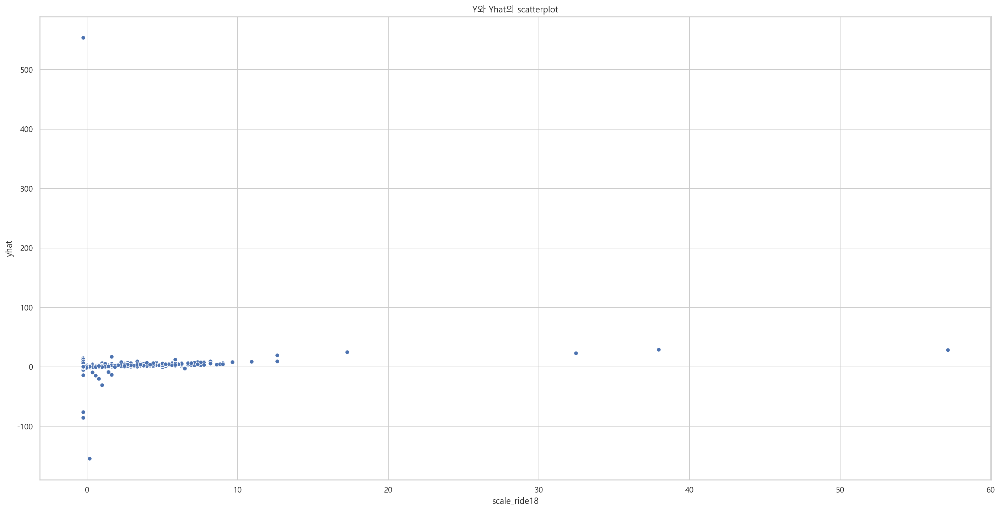

In [652]:
plt.figure(figsize=(24, 12))
sns.scatterplot('scale_ride18','yhat',data =df_te)
plt.title("Y와 Yhat의 scatterplot")
plt.show()

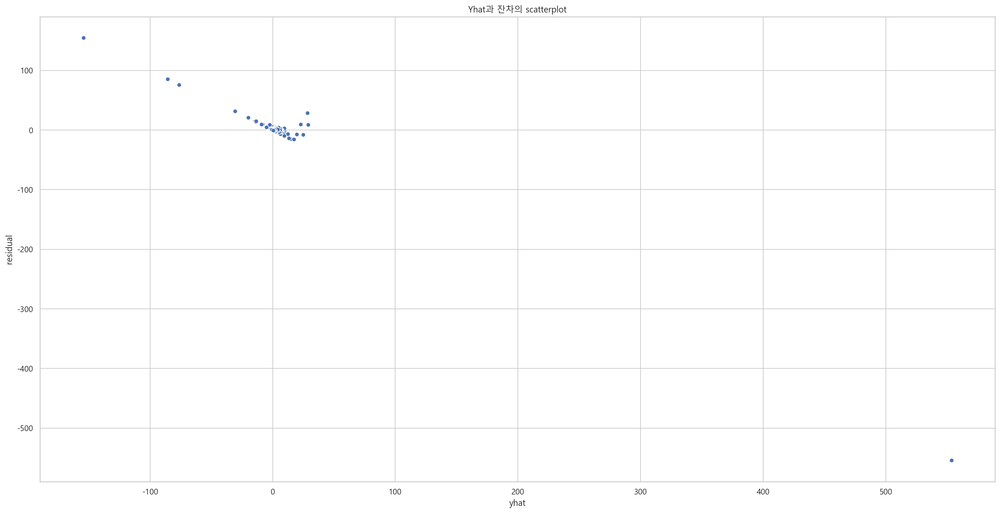

In [653]:
plt.figure(figsize=(24, 12))
sns.scatterplot(x='yhat', y='residual', data=df_te)
plt.title("Yhat과 잔차의 scatterplot")
plt.show()

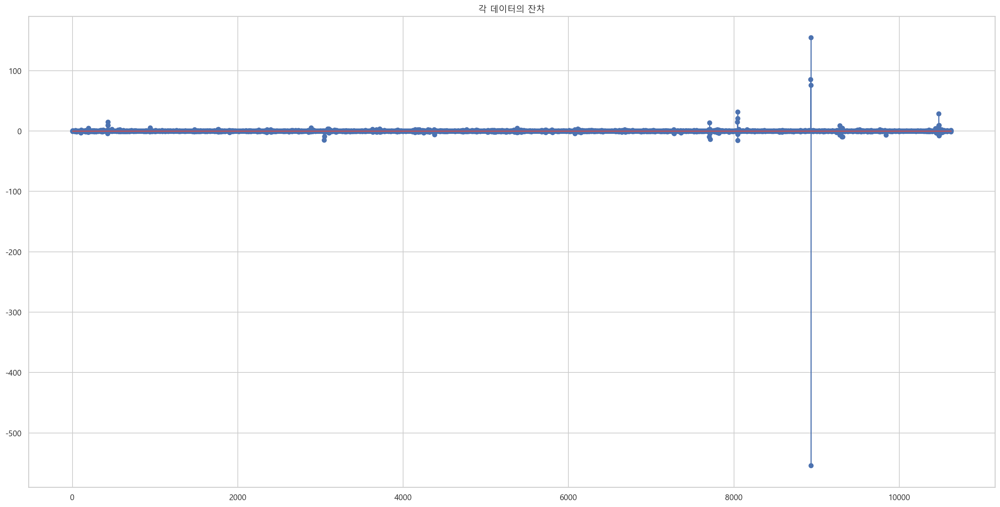

In [654]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] , data=df_te)
plt.title("각 데이터의 잔차")
plt.show()

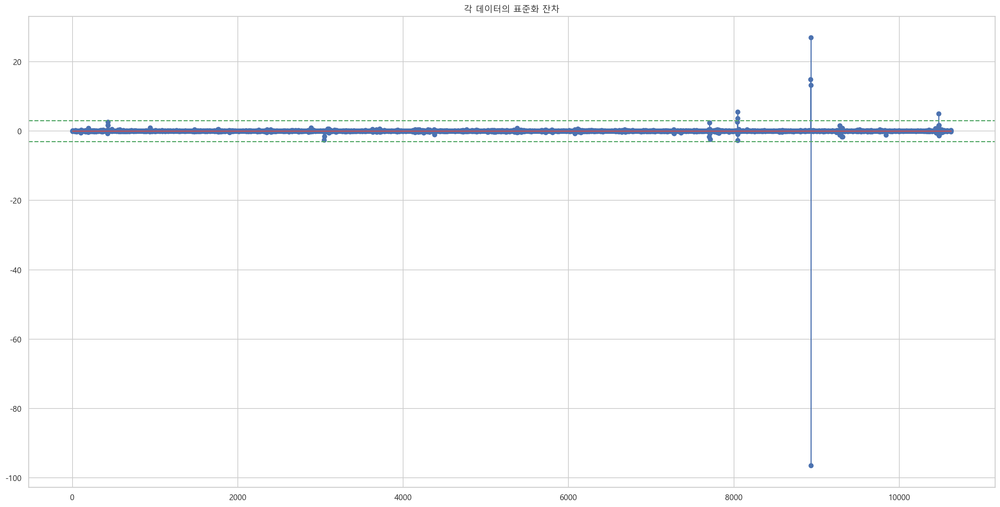

In [655]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] / df_te['residual'].std(), data=df_te)
plt.axhline(3, c="g", ls="--")
plt.axhline(-3, c="g", ls="--")
plt.title("각 데이터의 표준화 잔차")
plt.show()

In [679]:
# 2시간  해보기
# 스케일링 전
# var = ['ride67', 'ride89', 'ride1011', 'off67', 'off89', 'off1011',
#        'temperature', 'precipitation', 'bus_interval',
#        'ride_sum', 'off_sum']

var = ['scale_temperature', 'scale_precipitation', 'scale_bus_interval',
       'scale_ride67', 'scale_ride89', 'scale_ride1011',
       'scale_off67', 'scale_off89', 'scale_off1011', 'scale_ride_sum', 'scale_off_sum',
       'scale_bus_route_id_sum', 'scale_bus_route_id_all_sum']

cate = ['bus_route_id', 'in_', 'out', 'weekend', 'weekday', 'holiday','typhoon','si']  #
df_tr, df_te, df_error = ols_trian_test_try(test_frame, 312, var, cate)

In [680]:
# 에러난 정류장만 가져와서보기
df_error_check = pd.DataFrame(columns=df_te.columns)
for i in df_error['정류장']:
    a = df_te[df_te['station_code'] == i]
    df_error_check = pd.concat([df_error_check, a], axis=0)
print(len(test_frame), '개 중에', len(df_error_check), '개의 오류난 데이터가 있음')
df_error_check.tail(2)

43075 개 중에 175 개의 오류난 데이터가 있음


,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum,yhat
13,192396,2019-09-15,27120000,시내,806,신선동,33.51222,126.69925,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 조천읍 선흘리 4199,제주시,조천읍,선흘리,북선로,제주,24.6,0.0,91.0,15,6,Sunday,0.0,1.0,0,0,1,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3,35,-0.275619,-0.364096,-0.352257,-0.328017,0.217981,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,0.007400,-0.577456,-0.115037,-0.394228,-0.393431,-0.052419,-0.301137,-0.354218,-0.321936,-0.3306,-0.39572,-0.875019,-1.016079,-0.260965
20,268734,2019-09-20,27120000,시내,806,신선동,33.51222,126.69925,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 조천읍 선흘리 4199,제주시,조천읍,선흘리,북선로,제주,22.5,0.0,91.0,20,4,Friday,0.0,1.0,0,0,1,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3,35,-0.275619,-0.364096,-0.352257,-0.328017,0.217981,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-1.344904,-0.577456,-0.115037,-0.394228,-0.393431,-0.052419,-0.301137,-0.354218,-0.321936,-0.3306,-0.39572,-0.875019,-1.016079,-0.260965


In [681]:
## R스퀘어 구하기
# df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
# df_tr['yhat'] = round(df_tr['yhat'])
df_tr['residual'] = df_tr['scale_ride18'] - df_tr['yhat']
df_tr['explained'] = df_tr['yhat'] - np.mean(df_tr['yhat'])
df_tr['total'] = df_tr['scale_ride18'] - np.mean(df_tr['scale_ride18'])

# df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
# df_te['yhat'] = round(df_te['yhat'])
df_te['residual'] = df_te['scale_ride18'] - df_te['yhat']
df_te['explained'] = df_te['yhat'] - np.mean(df_te['yhat'])
df_te['total'] = df_te['scale_ride18'] - np.mean(df_te['scale_ride18'])

train_ess = np.sum((df_tr['explained'] ** 2))
train_rss = np.sum((df_tr['residual'] ** 2))
train_tss = np.sum((df_tr['total'] ** 2))
test_ess = np.sum((df_te['explained'] ** 2))
test_rss = np.sum((df_te['residual'] ** 2))
test_tss = np.sum((df_te['total'] ** 2))

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')

# RMSE 예측값 - y 제곱의 평균의 루트
print('학습 RMSE :',np.sqrt(((df_tr['scale_ride18'] - df_tr['yhat']) ** 2).mean()))
print('검증 RMSE :',np.sqrt(((df_te['scale_ride18'] - df_te['yhat']) ** 2).mean()))

train_ESS 22412.463187836183 입니다.
train_RSS 4623.574344251692 입니다.
train_TSS 27032.359636208486 입니다.
test_ESS 9459.267016899721 입니다.
test_RSS 4784.412770681708 입니다.
test_TSS 12853.417835708598 입니다.
학습 결정계수는 0.8289614962780146, 0.829097551580951 입니다.
검증 결정계수는 0.6277711631384193, 0.7359339856376994 입니다.
학습 RMSE : 0.3740498400287139
검증 RMSE : 0.6709790805771076


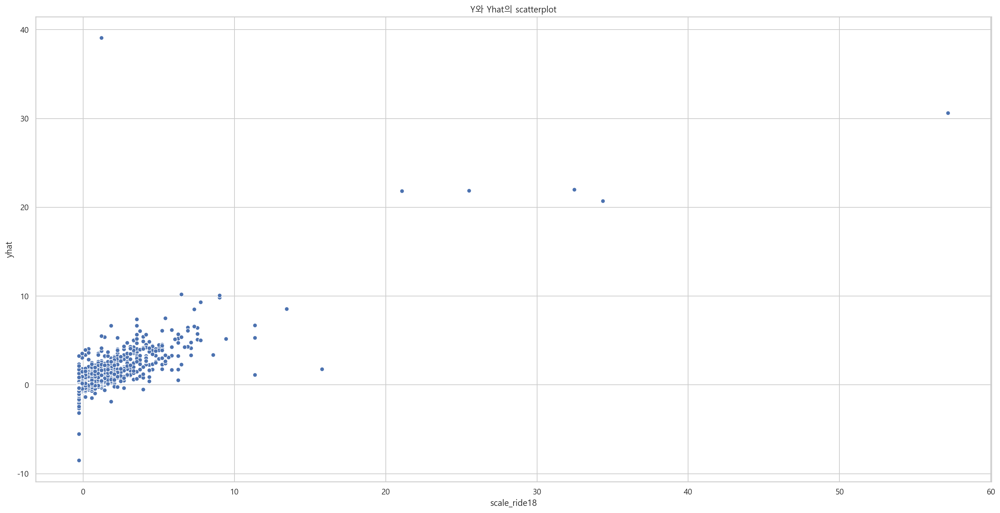

In [660]:
plt.figure(figsize=(24, 12))
sns.scatterplot('scale_ride18','yhat',data =df_te)
plt.title("Y와 Yhat의 scatterplot")
plt.show()

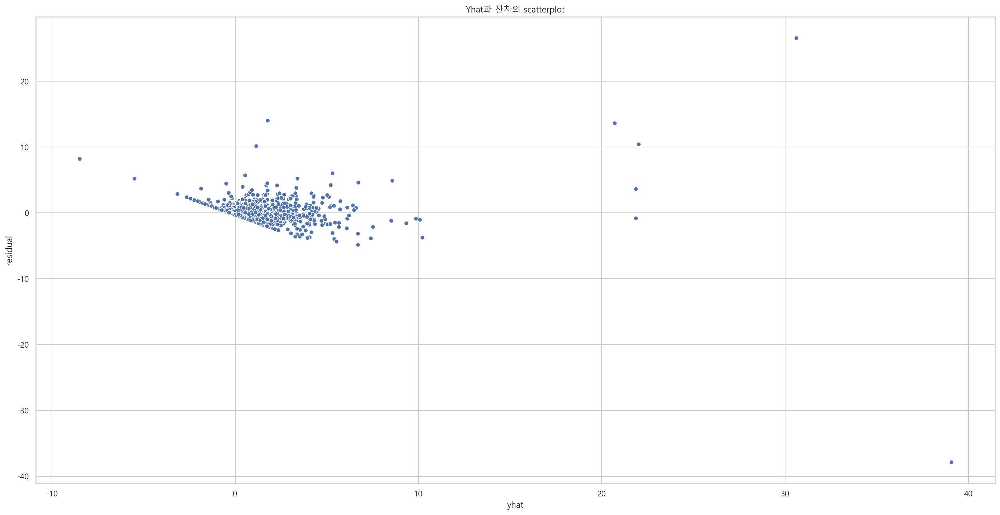

In [661]:
plt.figure(figsize=(24, 12))
sns.scatterplot(x='yhat', y='residual', data=df_te)
plt.title("Yhat과 잔차의 scatterplot")
plt.show()

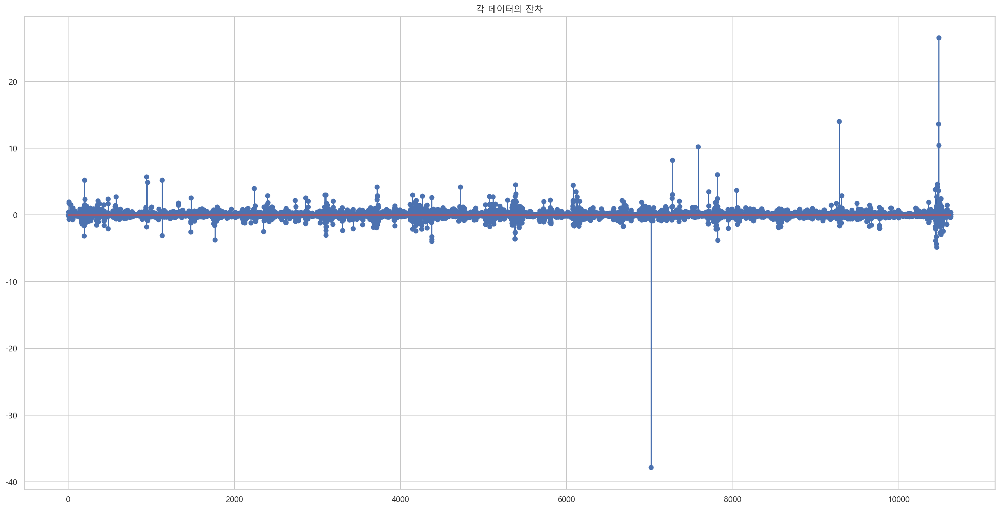

In [662]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] , data=df_te)
plt.title("각 데이터의 잔차")
plt.show()

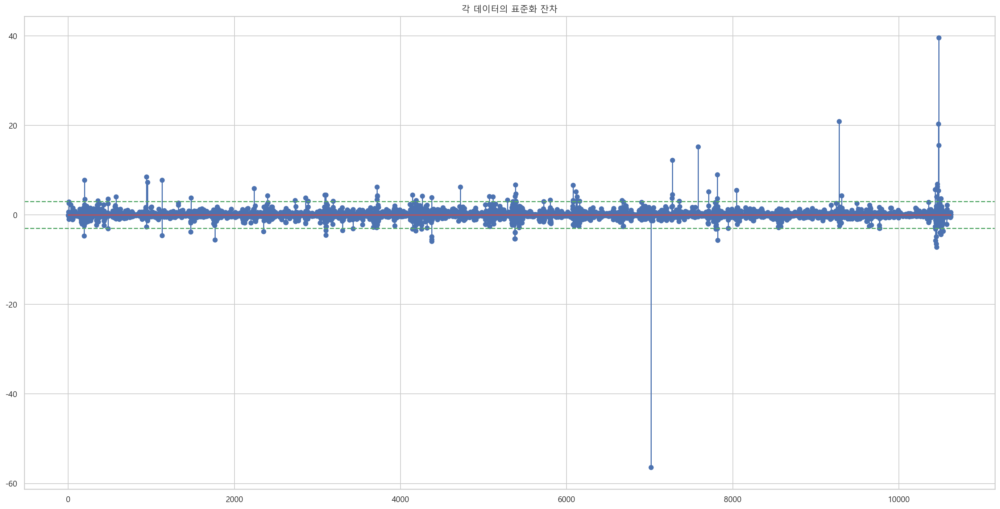

In [663]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] / df_te['residual'].std(), data=df_te)
plt.axhline(3, c="g", ls="--")
plt.axhline(-3, c="g", ls="--")
plt.title("각 데이터의 표준화 잔차")
plt.show()

In [664]:
# 둘다 넣어보기
# 스케일링 전
# var = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11',
#        'off6', 'off7', 'off8', 'off9', 'off10', 'off11',
#        'ride67', 'ride89', 'ride1011', 'off67', 'off89', 'off1011',
#        'temperature', 'precipitation', 'bus_interval',
#        'ride_sum', 'off_sum']

var = ['scale_ride6', 'scale_ride7', 'scale_ride8', 'scale_ride9', 'scale_ride10', 'scale_ride11',
       'scale_off6', 'scale_off7', 'scale_off8', 'scale_off9', 'scale_off10', 'scale_off11',
       'scale_temperature', 'scale_precipitation', 'scale_bus_interval',
       'scale_ride67', 'scale_ride89', 'scale_ride1011',
       'scale_off67', 'scale_off89', 'scale_off1011',
       'scale_ride_sum', 'scale_off_sum',
       'scale_bus_route_id_sum', 'scale_bus_route_id_all_sum']

cate = ['bus_route_id','in_','out','weekend', 'weekday','holiday','typhoon']  # 
df_tr, df_te, df_error = ols_trian_test_try(test_frame, 312, var, cate)

In [665]:
# 에러난 정류장만 가져와서보기
df_error_check = pd.DataFrame(columns=df_te.columns)
for i in df_error['정류장']:
    a = df_te[df_te['station_code'] == i]
    df_error_check = pd.concat([df_error_check, a], axis=0)
print(len(test_frame), '개 중에', len(df_error_check), '개의 오류난 데이터가 있음')
df_error_check.tail(2)

43075 개 중에 175 개의 오류난 데이터가 있음


,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum,yhat
13,192396,2019-09-15,27120000,시내,806,신선동,33.51222,126.69925,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 조천읍 선흘리 4199,제주시,조천읍,선흘리,북선로,제주,24.6,0.0,91.0,15,6,Sunday,0.0,1.0,0,0,1,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3,35,-0.275619,-0.364096,-0.352257,-0.328017,0.217981,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,0.007400,-0.577456,-0.115037,-0.394228,-0.393431,-0.052419,-0.301137,-0.354218,-0.321936,-0.3306,-0.39572,-0.875019,-1.016079,-0.260965
20,268734,2019-09-20,27120000,시내,806,신선동,33.51222,126.69925,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 조천읍 선흘리 4199,제주시,조천읍,선흘리,북선로,제주,22.5,0.0,91.0,20,4,Friday,0.0,1.0,0,0,1,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3,35,-0.275619,-0.364096,-0.352257,-0.328017,0.217981,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-1.344904,-0.577456,-0.115037,-0.394228,-0.393431,-0.052419,-0.301137,-0.354218,-0.321936,-0.3306,-0.39572,-0.875019,-1.016079,-0.260965


In [666]:
## R스퀘어 구하기
# df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
# df_tr['yhat'] = round(df_tr['yhat'])
df_tr['residual'] = df_tr['scale_ride18'] - df_tr['yhat']
df_tr['explained'] = df_tr['yhat'] - np.mean(df_tr['yhat'])
df_tr['total'] = df_tr['scale_ride18'] - np.mean(df_tr['scale_ride18'])

# df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
# df_te['yhat'] = round(df_te['yhat'])
df_te['residual'] = df_te['scale_ride18'] - df_te['yhat']
df_te['explained'] = df_te['yhat'] - np.mean(df_te['yhat'])
df_te['total'] = df_te['scale_ride18'] - np.mean(df_te['scale_ride18'])

train_ess = np.sum((df_tr['explained'] ** 2))
train_rss = np.sum((df_tr['residual'] ** 2))
train_tss = np.sum((df_tr['total'] ** 2))
test_ess = np.sum((df_te['explained'] ** 2))
test_rss = np.sum((df_te['residual'] ** 2))
test_tss = np.sum((df_te['total'] ** 2))

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')

# RMSE 예측값 - y 제곱의 평균의 루트
print('학습 RMSE :',np.sqrt(((df_tr['scale_ride18'] - df_tr['yhat']) ** 2).mean()))
print('검증 RMSE :',np.sqrt(((df_te['scale_ride18'] - df_te['yhat']) ** 2).mean()))

train_ESS 22810.450315067596 입니다.
train_RSS 4240.119289332327 입니다.
train_TSS 27032.359636208486 입니다.
test_ESS 129681.17000970077 입니다.
test_RSS 124957.12354848959 입니다.
test_TSS 12853.417835708598 입니다.
학습 결정계수는 0.8431465345092221, 0.8438201704195347 입니다.
검증 결정계수는 -8.721703996997682, 10.089236315762511 입니다.
학습 RMSE : 0.35820330469803185
검증 RMSE : 3.429060672398915


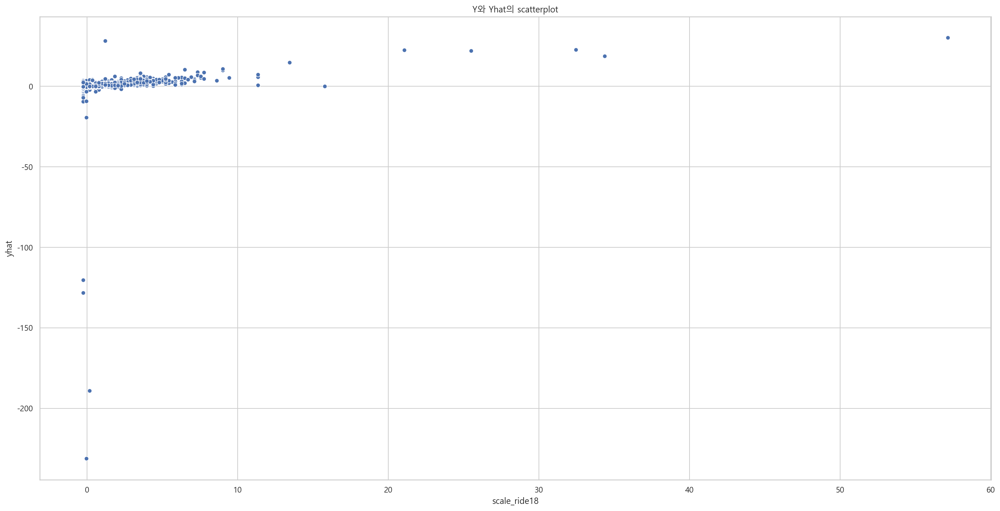

In [667]:
plt.figure(figsize=(24, 12))
sns.scatterplot('scale_ride18','yhat',data =df_te)
plt.title("Y와 Yhat의 scatterplot")
plt.show()

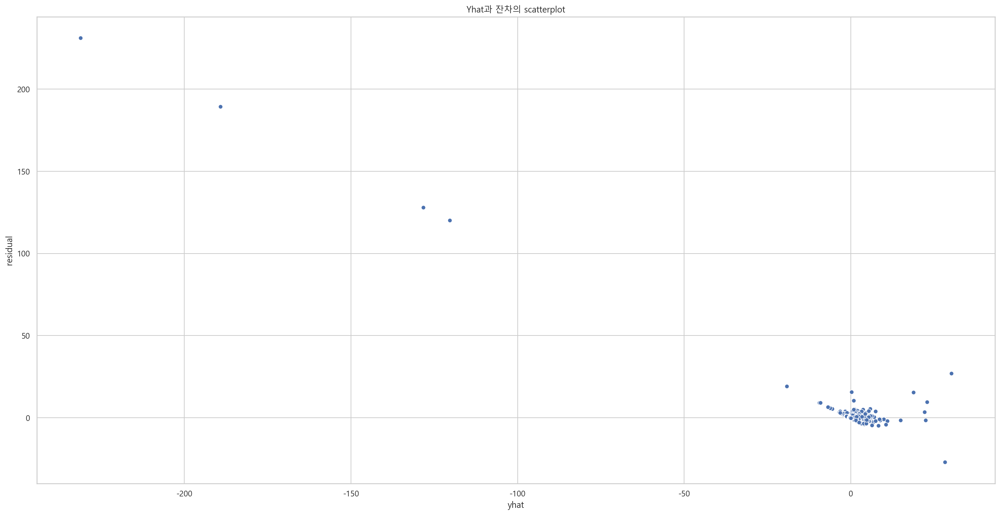

In [668]:
plt.figure(figsize=(24, 12))
sns.scatterplot(x='yhat', y='residual', data=df_te)
plt.title("Yhat과 잔차의 scatterplot")
plt.show()

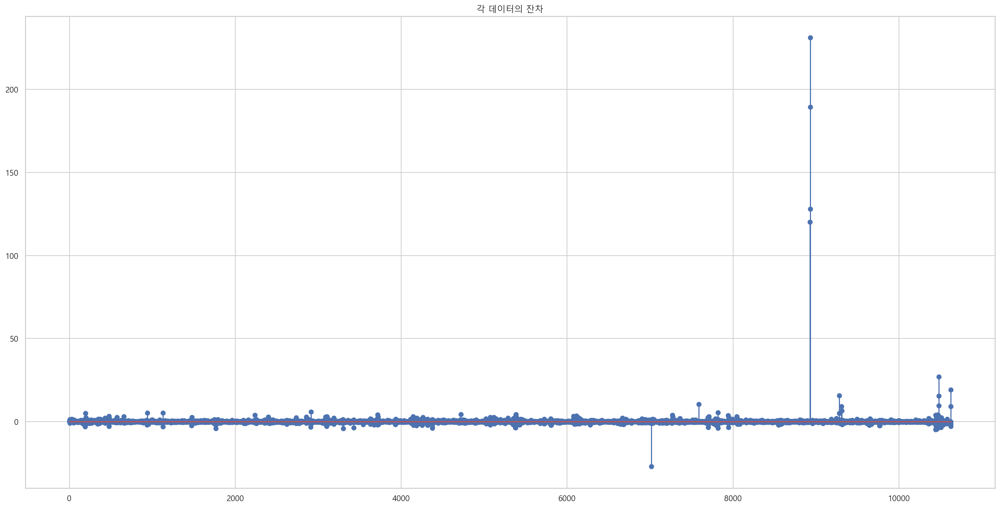

In [669]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] , data=df_te)
plt.title("각 데이터의 잔차")
plt.show()

In [677]:
df_tr[df_tr['station_code'] == 663]

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum,yhat,residual,explained,total
12,228619,2019-09-17,32000000,시내,663,전원유치원,33.48724,126.53966,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,23.8,0.0,66.0,17,1,Tuesday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24,-0.275619,0.083108,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-0.507764,-0.577456,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-1.03506,-1.04663,-0.260965,1.642020e-13,-0.275501,-0.275359
16,288063,2019-09-21,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,20.5,156.0,66.0,21,5,Saturday,0.0,1.0,0,1,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24,0.629063,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-2.632813,4.709295,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-1.03506,-1.04663,-0.260965,-6.328271e-15,-0.275501,-0.275359
8,166770,2019-09-12,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,24.1,0.6,66.0,12,3,Thursday,1.0,0.0,1,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24,0.629063,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-0.314577,-0.557123,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-1.03506,-1.04663,-0.260965,1.073586e-13,-0.275501,-0.275359
7,155043,2019-09-11,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,26.0,5.0,66.0,11,2,Wednesday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1,24,0.629063,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,0.427187,-0.276518,0.372398,0.908936,-0.408009,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,-0.354218,0.078214,-0.330600,-0.21458,-1.03506,-1.04663,0.372398,4.440892e-14,0.357862,0.358003
3,71165,2019-09-05,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,26.2,7.0,66.0,5,3,Thursday,1.0,0.0,0,0,1,0,1.0,2.0,2.0,0.0,0.0,0.0,5.0,0.0,1,24,0.629063,-0.364096,0.089289,0.190832,0.757079,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.049844,1.037727,-0.340230,-0.229808,-0.041868,0.156829,0.248997,-0.301137,-0.354218,-0.321936,0.155092,-0.39572,-1.03506,-1.04663,-0.049844,-4.204970e-13,-0.064380,-0.064238
0,25347,2019-09-02,32000000,시내,663,전원유치원,33.48724,126.53966,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,24.1,25.7,66.0,2,0,Monday,1.0,0.0,0,0,1,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24,-0.275619,-0.364096,0.089289,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.049844,-0.314577,0.293502,-0.229808,-0.394228,-0.118301,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-1.03506,-1.04663,-0.049844,-2.499667e-13,-0.0

In [676]:
df_te[df_te['residual'] >= 100.12172889743582]

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ride_sum,off_sum,bus_route_id_sum,bus_route_id_all_sum,scale_ride6,scale_ride7,scale_ride8,scale_ride9,scale_ride10,scale_ride11,scale_off6,scale_off7,scale_off8,scale_off9,scale_off10,scale_off11,scale_ride18,scale_temperature,scale_precipitation,scale_bus_interval,scale_ride67,scale_ride89,scale_ride1011,scale_off67,scale_off89,scale_off1011,scale_ride_sum,scale_off_sum,scale_bus_route_id_sum,scale_bus_route_id_all_sum,yhat,residual,explained,total
1,40794,2019-09-03,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,24.8,13.9,66.0,3,1,Tuesday,1.0,0.0,0,0,1,0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,1,24,0.629063,-0.364096,0.089289,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,0.136191,-0.106393,-0.229808,-0.041868,-0.118301,-0.353835,-0.301137,-0.354218,-0.321936,-0.209177,-0.39572,-1.03506,-1.04663,-120.346226,120.085262,-120.277901,-0.265833
5,108636,2019-09-08,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,24.5,19.0,66.0,8,6,Sunday,0.0,1.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,24,0.629063,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,-0.260965,-0.056995,0.066443,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,-0.354218,-0.321936,-0.330600,-0.39572,-1.03506,-1.04663,-128.305354,128.044389,-128.237029,-0.265833
14,260351,2019-09-19,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,22.8,0.0,66.0,19,3,Thursday,1.0,0.0,0,0,1,0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,1,24,0.629063,-0.364096,0.089289,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,-0.288995,-0.288867,-0.276518,0.161277,-1.151718,-0.577456,-0.229808,-0.041868,-0.118301,-0.353835,-0.301137,-0.354218,-0.321936,-0.209177,-0.39572,-1.03506,-1.04663,-189.129385,189.290662,-189.061060,0.156409
15,276227,2019-09-20,32000000,시내,663,전원유치원,33.48724,126.53966,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,제주특별자치도 제주시 아라일동 2470-4,제주시,제주시,아라일동,연북로,제주,22.5,0.0,66.0,20,4,Friday,0.0,1.0,0,0,1,0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1,24,0.629063,-0.364096,-0.352257,-0.328017,-0.321116,-0.300922,-0.189535,-0.271387,-0.311961,0.394373,-0.288867,-0.276518,-0.049844,-1.344904,-0.577456,-0.229808,-0.041868,-0.393431,-0.353835,-0.301137,0.027637,-0.321936,-0.330600,-0.21458,-1.03506,-1.04663,-231.171573,231.121729,-231.103248,-0.054712


In [673]:
df_te['residual'].max()

231.12172889743582

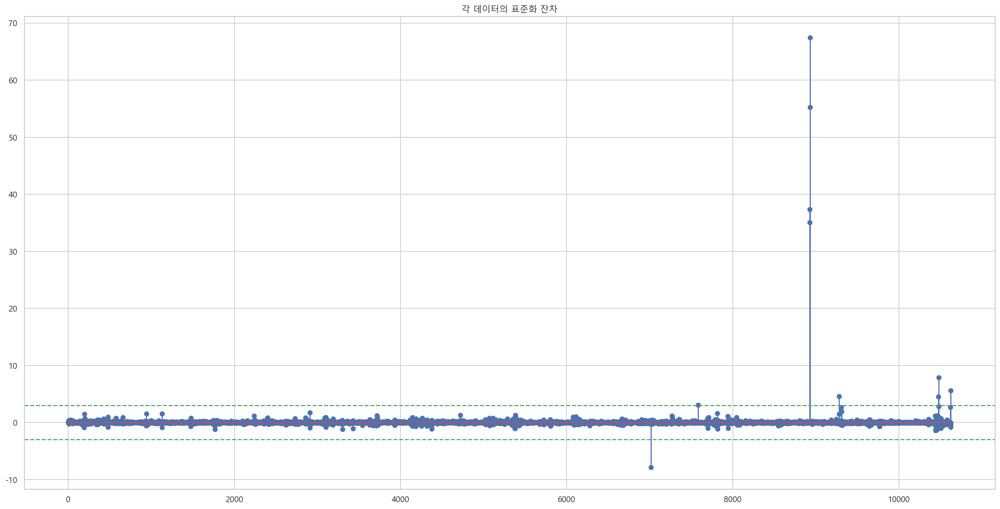

In [670]:
plt.figure(figsize=(24, 12))
plt.stem(df_te['residual'] / df_te['residual'].std(), data=df_te)
plt.axhline(3, c="g", ls="--")
plt.axhline(-3, c="g", ls="--")
plt.title("각 데이터의 표준화 잔차")
plt.show()

# test 데이터로 검증

In [472]:
# test에는 있는데, test_frame에는 없는 정류장
y = list(set(test_frame['station_code'].unique()) - set(df_test['station_code'].unique()))
print(len(y))
y

14


[1987,
 3043,
 709,
 1062,
 3304,
 2185,
 746,
 3342,
 943,
 2931,
 3412,
 1302,
 2167,
 922]

In [473]:
for i in y:
    test_frame= test_frame[test_frame['station_code'] != i]

In [490]:
columns = test_frame.columns
df_test_val = pd.DataFrame(columns=columns)
df_test_val['yhat'] = 999

for i in test_frame['station_code'].unique():
    sample2 = df_test[df_test['station_code'] == i]
    sample2_model = sample2[var+cate] #테스트 모델
    # 모델 검증
    # ## Load pickle
    name = 'model/'+str(i) + '.pkl'
    with open(name,"rb") as fr:
        result = pickle.load(fr)           
    sample2['yhat'] = result.predict(sample2_model)
    # 저장
    df_test_val = pd.concat([df_test_val, sample2])

FileNotFoundError: [Errno 2] No such file or directory: 'model/1829.pkl'

In [491]:
df_test_val['ride18'].sum()

0

In [489]:
df_test_val['yhat'].describe()

count    6.779000e+03
mean     1.255089e+11
std      3.636289e+12
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.000000e+00
max      1.628990e+14
Name: yhat, dtype: float64

In [478]:
df_test_val[['ride18', 'yhat', 'residual', 'explained', 'total']]

,ride18,yhat,residual,explained,total
310079,0.0,0.0,0.0,-1.255089e+11,-1.28485
301198,0.0,0.0,0.0,-1.255089e+11,-1.28485
221906,0.0,0.0,0.0,-1.255089e+11,-1.28485
326154,0.0,0.0,0.0,-1.255089e+11,-1.28485
213413,0.0,0.0,0.0,-1.255089e+11,-1.28485
...,...,...,...,...,...
225610,0.0,0.0,0.0,-1.255089e+11,-1.28485
43749,4.0,3.0,1.0,-1.255089e+11,2.71515
83741,0.0,0.0,0.0,-1.255089e+11,-1.28485
378398,2.0,2.0,0.0,-1.255089e+11,0.71515


In [475]:
## R스퀘어 구하기
# df_test_val.loc[df_test_val['yhat'] < 0, 'yhat'] = 0
df_test_val['yhat'] = round(df_test_val['yhat'])
df_test_val['residual'] = df_test_val['ride18'] - df_test_val['yhat']
df_test_val['explained'] = df_test_val['yhat'] - np.mean(df_test_val['yhat'])
df_test_val['total'] = df_test_val['ride18'] - np.mean(df_test_val['ride18'])

test_ess = np.sum((df_test_val['explained'] ** 2))
test_rss = np.sum((df_test_val['residual'] ** 2))
test_tss = np.sum((df_test_val['total'] ** 2))

print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'테스트 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')

# RMSE 예측값 - y 제곱의 평균의 루트
print('테스트 RMSE :',np.sqrt(((df_test_val['ride18'] - df_test_val['yhat']) ** 2).mean()))

test_ESS 8.962274407507326e+28 입니다.
test_RSS 8.972953016418881e+28 입니다.
test_TSS 179784.95412302698 입니다.
테스트 결정계수는 -4.990936566515284e+23, 4.984996909905172e+23 입니다.
테스트 RMSE : 3638185845700.0264


# 전체 데이터 돌려본것

In [105]:
## R스퀘어 구하기
df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
df_tr['yhat'] = round(df_tr['yhat'])
df_tr['residual'] = df_tr['ride18'] - df_tr['yhat']
df_tr['explained'] = df_tr['yhat'] - np.mean(df_tr['yhat'])
df_tr['total'] = df_tr['ride18'] - np.mean(df_tr['ride18'])

df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
df_te['yhat'] = round(df_te['yhat'])
df_te['residual'] = df_te['ride18'] - df_te['yhat']
df_te['explained'] = df_te['yhat'] - np.mean(df_te['yhat'])
df_te['total'] = df_te['ride18'] - np.mean(df_te['ride18'])

train_ess = np.sum((df_tr['explained'] ** 2))
train_rss = np.sum((df_tr['residual'] ** 2))
train_tss = np.sum((df_tr['total'] ** 2))
test_ess = np.sum((df_te['explained'] ** 2))
test_rss = np.sum((df_te['residual'] ** 2))
test_tss = np.sum((df_te['total'] ** 2))

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')

# RMSE 예측값 - y 제곱의 평균의 루트
print('학습 RMSE :',np.sqrt(((df_tr['ride18'] - df_tr['yhat']) ** 2).mean()))
print('검증 RMSE :',np.sqrt(((df_te['ride18'] - df_te['yhat']) ** 2).mean()))

train_ESS 6700134.111907619 입니다.
train_RSS 1950373.0 입니다.
train_TSS 8647967.658369122 입니다.
test_ESS 498009.9472353467 입니다.
test_RSS 210658.0 입니다.
test_TSS 628276.036419359 입니다.
학습 결정계수는 0.7744703637839678, 0.7747640112210092 입니다.
검증 결정계수는 0.6647047033648266, 0.7926610571900551 입니다.
학습 RMSE : 2.2655393579667678
검증 RMSE : 2.3195052731222416


$$\text{RMSE}= \sqrt{\frac1{N}\sum_{i=1}^N (y_i - \hat{y}_i)^2}$$

In [94]:
df_tr['ride18'] - df_tr['yhat'] ** 2

-95.48959069626423

In [88]:
((df_tr['ride18'] - df_tr['yhat']) ** 2).mean()

0.4567360620249042

In [418]:
df_te

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,date_day,date_dayofweek,date_dayofname,holiday,yhat,residual,explained,total
83,142831,2019-09-11,23010000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,1.0,1.0,0.0,0.0,0.0,3.0,5.0,3.0,3.0,2.0,0.0,11,2,Wednesday,0.0,4.940392e-01,-4.940392e-01,0.040605,-0.086957
123,215924,2019-09-17,23010000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,6.0,4.0,3.0,1.0,0.0,17,1,Tuesday,0.0,1.204688e-01,-1.204688e-01,-0.332965,-0.086957
142,247678,2019-09-19,23010000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,7.0,2.0,0.0,0.0,19,3,Thursday,0.0,-4.138490e-01,4.138490e-01,-0.867283,-0.086957
1,1805,2019-09-01,23030000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,6,Sunday,1.0,1.041268e-01,-1.041268e-01,-0.349307,-0.086957
94,158033,2019-09-12,23030000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0,12,3,Thursday,1.0,-2.903455e-02,2.903455e-02,-0.482469,-0.086957
9,13892,2019-09-02,23110000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0.0,2,0,Monday,0.0,9.552325e-02,-9.552325e-02,-0.357911,-0.086957
44,74864,2019-09-06,23110000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,1.0,0.0,6,4,Friday,1.0,4.066499e-01,-4.066499e-01,-0.046784,-0.086957
66,112138,2019-09-09,23130000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,9,0,Monday,0.0,4.385174e-02,9.561483e-01,-0.409582,0.913043
126,216545,2019-09-17,23130000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,17,1,Tuesday,0.0,1.082792e-01,-1.082792e-01,-0.345155,-0.086957
46,76605,2019-09-06,23580000,0,444,탐라도서관,33.47756,126.47741,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,8.0,8.0,7.0,6.0,0.0,6,4,Friday,1.0,2.961352e+00,-2.961352e+00,2.507918,-0.086957


# 전체 학습 데이터 돌려봤을때

In [427]:
var = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11',
       'off6', 'off7', 'off8', 'off9', 'off10', 'off11']
cate = ['bus_route_id']

df_tr2, df_te2 = ols_trian_test(df_train, 100, var, cate)

In [430]:
## R스퀘어 구하기
# df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
# df_tr['yhat'] = round(df_tr['yhat'])
df_tr2['residual'] = df_tr2['ride18'] - df_tr2['yhat']
df_tr2['explained'] = df_tr2['yhat'] - np.mean(df_tr2['yhat'])
# df_tr2['total'] = df_tr2['ride18'] - np.mean(df_tr2['ride18'])
df_tr2['total'] = df_tr2['ride18'] - df_tr2['yhat'] + df_tr2['yhat'] - np.mean(df_tr2['ride18'])

# df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
# df_te['yhat'] = round(df_te['yhat'])
df_te2['residual'] = df_te2['ride18'] - df_te2['yhat']
df_te2['explained'] = df_te2['yhat'] - np.mean(df_te2['yhat'])
# df_te2['total'] = df_te2['ride18'] - np.mean(df_te2['ride18'])
df_te2['total'] = df_te2['ride18'] - df_te2['yhat'] + df_te2['yhat'] - np.mean(df_te2['ride18'])

train_ess = (df_tr2['explained'] ** 2).sum()
train_rss = (df_tr2['residual'] ** 2).sum()
train_tss = (df_tr2['total'] ** 2).sum()
test_ess = (df_te2['explained'] ** 2).sum()
test_rss = (df_te2['residual'] ** 2).sum()
test_tss = (df_te2['total'] ** 2).sum()

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')
# RMSE y - 예측값 제곱의 평균의 루트
print('검증 RMSE :',np.sqrt(((df_te2['ride18'] - df_te2['yhat']) ** 2).mean()))
print('학습 RMSE :',np.sqrt(((df_tr2['ride18'] - df_tr2['yhat']) ** 2).mean()))

train_ESS 4347487.021085202 입니다.
train_RSS 1196077.8411714036 입니다.
train_TSS 5543564.8622566 입니다.
test_ESS 787383.7879405643 입니다.
test_RSS 360971.05092254095 입니다.
test_TSS 904534.75018607 입니다.
학습 결정계수는 0.78424030909877, 0.7842403090987711 입니다.
검증 결정계수는 0.6009318040591737, 0.8704848407190473 입니다.
검증 RMSE : 2.94390282620684
학습 RMSE : 2.2375068624954406


In [431]:
## R스퀘어 구하기
# df_tr.loc[df_tr['yhat'] < 0, 'yhat'] = 0
# df_tr['yhat'] = round(df_tr['yhat'])
df_tr2['residual'] = df_tr2['ride18'] - df_tr2['yhat']
df_tr2['explained'] = df_tr2['yhat'] - np.mean(df_tr2['yhat'])
df_tr2['total'] = df_tr2['ride18'] - np.mean(df_tr2['ride18'])
# df_tr2['total'] = df_tr2['ride18'] - df_tr2['yhat'] + df_tr2['yhat'] - np.mean(df_tr2['ride18'])

# df_te.loc[df_te['yhat'] < 0, 'yhat'] = 0
# df_te['yhat'] = round(df_te['yhat'])
df_te2['residual'] = df_te2['ride18'] - df_te2['yhat']
df_te2['explained'] = df_te2['yhat'] - np.mean(df_te2['yhat'])
df_te2['total'] = df_te2['ride18'] - np.mean(df_te2['ride18'])
# df_te2['total'] = df_te2['ride18'] - df_te2['yhat'] + df_te2['yhat'] - np.mean(df_te2['ride18'])

train_ess = (df_tr2['explained'] ** 2).sum()
train_rss = (df_tr2['residual'] ** 2).sum()
train_tss = (df_tr2['total'] ** 2).sum()
test_ess = (df_te2['explained'] ** 2).sum()
test_rss = (df_te2['residual'] ** 2).sum()
test_tss = (df_te2['total'] ** 2).sum()

print(f'train_ESS {train_ess} 입니다.')
print(f'train_RSS {train_rss} 입니다.')
print(f'train_TSS {train_tss} 입니다.')
print(f'test_ESS {test_ess} 입니다.')
print(f'test_RSS {test_rss} 입니다.')
print(f'test_TSS {test_tss} 입니다.')

print(f'학습 결정계수는 {1-train_rss/train_tss}, {train_ess/train_tss} 입니다.')
print(f'검증 결정계수는 {1-test_rss/test_tss}, {test_ess/test_tss} 입니다.')
# RMSE y - 예측값 제곱의 평균의 루트
print('검증 RMSE :',np.sqrt(((df_te2['ride18'] - df_te2['yhat']) ** 2).mean()))
print('학습 RMSE :',np.sqrt(((df_tr2['ride18'] - df_tr2['yhat']) ** 2).mean()))

train_ESS 4347487.021085202 입니다.
train_RSS 1196077.8411714036 입니다.
train_TSS 5543564.8622566 입니다.
test_ESS 787383.7879405643 입니다.
test_RSS 360971.05092254095 입니다.
test_TSS 904534.75018607 입니다.
학습 결정계수는 0.78424030909877, 0.7842403090987711 입니다.
검증 결정계수는 0.6009318040591737, 0.8704848407190473 입니다.
검증 RMSE : 2.94390282620684
학습 RMSE : 2.2375068624954406


# 피드백 받기전

In [67]:
# # VIF 확인
# vif = pd.DataFrame()
# vif["VIF Factor"] = [variance_inflation_factor(jeju.values, i) for i in range(jeju.shape[1])]
# vif["features"] = jeju.columns
# vif